In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import xarray as xr
from netCDF4 import Dataset
import xarray as xr
import os
from datetime import datetime
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from scipy import stats
import geocat.viz.util as gvutil
import cmaps as gvcmaps
from geocat.comp import eofunc_eofs, eofunc_pcs
from sklearn.cross_decomposition import CCA
#import geocat.datafiles as gdf
import geocat.viz as gv
import cdo
import matplotlib.colors as colors
import matplotlib.patches as mpatch
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import tabulate

In [2]:
from cdo import *
cdo = Cdo()

***Data***

Source of the SST data: https://psl.noaa.gov/data/gridded/data.noaa.ersst.v5.html 
Source of the SIC data: https://cds.climate.copernicus.eu/datasets/reanalysis-era5-single-levels-monthly-means?tab=overview

***Anomalies***

Towards performing the analyses presented in this script the following treatment is applied to all data sets: first, the annual cycle is removed from the original time series. Second, monthly anomalies are calculated relative to the 1980 – 2010 period. Thereafter, means are computed.

***EOF on SST data***

In [3]:
# Load the dataset
fnc = 'anm.anom.sst.Ersstv5.19502023.nc'
dsg = xr.open_dataset(fnc)
print(dsg)

<xarray.Dataset> Size: 5MB
Dimensions:    (time: 74, bnds: 2, lon: 180, lat: 89)
Coordinates:
  * time       (time) datetime64[ns] 592B 1950-06-16 1951-06-16 ... 2023-06-16
  * lon        (lon) float32 720B 0.0 2.0 4.0 6.0 ... 352.0 354.0 356.0 358.0
  * lat        (lat) float32 356B 88.0 86.0 84.0 82.0 ... -84.0 -86.0 -88.0
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 1kB ...
    sst        (time, lat, lon) float32 5MB ...
Attributes: (12/39)
    CDI:                       Climate Data Interface version 2.0.5 (https://...
    source:                    In situ data: ICOADS R3.0 before 2015, NCEP in...
    institution:               This version written at NOAA/ESRL PSD: obtaine...
    Conventions:               CF-1.6, ACDD-1.3
    climatology:               Climatology is based on 1971-2000 SST, Xue, Y....
    description:               In situ data: ICOADS2.5 before 2007 and NCEP i...
    ...                        ...
    license: 

In [4]:
#Select period and region

ystr = 1950
yend = 2023

latS = -88.
latN = 88.
lonW = 0.
lonE = 358.

neof = 8

anm=dsg.sst
#print(anm)

# put the data in a format required by geocat.eof and which can allow to make easy changes regarding the region/period selected

anmD = anm.sortby("lat", ascending=True)
clat = anmD['lat'].astype(np.float64)
clat = np.sqrt(np.cos(np.deg2rad(clat)))
wanm = anmD 
wanm = anmD* clat
wanm.attrs = anmD.attrs
wanm.attrs['long_name'] = 'Wgt: ' + wanm.attrs['long_name']
#print(wanm)

lon = wanm['lon']
if ( ((lonW < 0) or (lonE < 0 )) and (lon.values.min() > -1) ):
   wanm=wanm.assign_coords(lon=( (lon + 180) % 360 - 180) )
   wanm = wanm.sortby("lon")
   print(' change longitude ')
         #print(wanm)  
    
xw = wanm.sel(lat=slice(latS, latN), lon=slice(lonW, lonE))
xw_anm = xw.transpose('time', 'lat', 'lon')
    #print(xw_anm)
    
lon = wanm['lon']
if ( ((lonW < 0) or (lonE < 0 )) and (lon.values.min() > -1) ):
   wanm=wanm.assign_coords(lon=( (lon + 180) % 360 - 180) )
   wanm = wanm.sortby("lon")
   print(' change longitude ')
 
#print(wanm) 

# -- Perfom EOF analysis

eofs_sst = eofunc_eofs(xw_anm.data, neofs=neof, meta=True)
pcs_sst = eofunc_pcs(xw_anm.data, npcs=neof, meta=True)
pcs_norm_sst = eofunc_pcs(xw_anm.data, npcs=neof, meta=True)
sdev_sst=pcs_sst.std(dim='time')
pcs_norm_sst = pcs_sst / pcs_sst.std(dim='time')
pcs_norm_sst['time']=anmD['time']
pcs_sst['time']=anmD['time']
pcs_sst.attrs['varianceFraction'] = eofs_sst.attrs['varianceFraction']
pcs_norm_sst.attrs['varianceFraction'] = eofs_sst.attrs['varianceFraction']
#print(pcs)
evec_sst = xr.DataArray(data=eofs_sst, dims=('eof','lat','lon'),
    coords = {'eof': np.arange(0,neof), 'lat': xw['lat'], 'lon': xw['lon']} )
#print(evec_sst)
eigenvalues_sst = eofs_sst.attrs['varianceFraction']

***Reconstruct the SST field based on the first 8 EOFs***

In [5]:
#export the PCs in a format usable for CCA

df=pcs_norm_sst.to_dataframe().unstack().transpose() 
df.to_csv('RezEOF.PC.sst.obs.19502023.8pcs.normalized.txt')

In [6]:
import netCDF4

# Step 1: Multiply each EOF with its associated PC to reconstruct the initial field
eof_pcs_products = []
for i in range(8):  # Assuming you are using the first 10 EOFs
    eof_pcs_product = pcs_sst[i, :] * evec_sst.sel(eof=i)
    eof_pcs_products.append(eof_pcs_product)

# Step 2: Sum the products to reconstruct the initial field
reconstructed_field = sum(eof_pcs_products)

# Output file setup
output_file = "SST_rec8EOF19502023_ok.nc"
ncfile = netCDF4.Dataset(output_file, mode='w', format='NETCDF4')

# Create dimensions
ncfile.createDimension('lat', reconstructed_field.sizes['lat'])
ncfile.createDimension('lon', reconstructed_field.sizes['lon'])
ncfile.createDimension('time', reconstructed_field.sizes['time'])

# Create variables in the NetCDF file
latitudes = ncfile.createVariable('lat', np.float32, ('lat',))
longitudes = ncfile.createVariable('lon', np.float32, ('lon',))
times = ncfile.createVariable('time', np.float64, ('time',))  # Use np.float64 for datetime64 compatibility

# Assign data to variables
latitudes[:] = reconstructed_field['lat'].values
longitudes[:] = reconstructed_field['lon'].values

# Convert numpy.datetime64 to datetime objects
datetime_values = pd.to_datetime(dsg['time'].values).to_pydatetime()

# Assign time data with correct units and values
times.units = 'days since 1950-01-01 00:00:00'
times.calendar = 'gregorian'
times[:] = netCDF4.date2num(datetime_values, units=times.units, calendar=times.calendar)

# sst variable
sst_var = ncfile.createVariable('sst', np.float32, ('time', 'lat', 'lon'))
sst_var[:, :, :] = reconstructed_field.data  # Assuming reconstructed_field is an xarray DataArray with the correct shape

# Close the file
ncfile.close()

***EOF on SIC data***

In [7]:
fnc ='anm_anom_ERA5_SIC_1950_2023.nc'
ds1_sic = xr.open_dataset(fnc)
print(ds1_sic)

<xarray.Dataset> Size: 307MB
Dimensions:    (time: 74, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * time       (time) datetime64[ns] 592B 1950-06-16 1951-06-16 ... 2023-06-16
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude   (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 1kB ...
    siconc     (time, latitude, longitude) float32 307MB ...
Attributes:
    CDI:          Climate Data Interface version 1.9.9rc1 (https://mpimet.mpg...
    Conventions:  CF-1.6
    history:      Mon May 19 17:47:25 2025: cdo -O -s -selyear,1950/2023 /isi...
    CDO:          Climate Data Operators version 1.9.9rc1 (https://mpimet.mpg...


In [8]:
# ----- Period and area setting ------
ystr = 1950
yend = 2023

latS = -90.
latN = 90.
lonW = 0.
lonE = 360.
neof = 8

anm=ds1_sic.siconc

# -- EOF --

anmnD = anm.sortby("latitude", ascending=True)
clat = anmnD['latitude'].astype(np.float64)
clat = np.sqrt(np.cos(np.deg2rad(clat)))
wanm = anmnD 
wanm = anmnD * clat
wanm.attrs = anmnD.attrs
#wanm.attrs['long_name'] = 'Wgt: ' + wanm.attrs['long_name']
#print(wanm)

lon = wanm['longitude']
if ( ((lonW < 0) or (lonE < 0 )) and (lon.values.min() > -1) ):
   wanm=wanm.assign_coords(lon=( (lon + 180) % 360 - 180) )
   wanm = wanm.sortby("lon")
   print(' change longitude ')
#print(wanm)

xw = wanm.sel(latitude=slice(latS, latN), longitude=slice(lonW, lonE))
xw_anm = xw.transpose('time', 'latitude', 'longitude')
#print(xw_anm)

eofs_sic = eofunc_eofs(xw_anm.data, neofs=neof, meta=True)
pcs_sic = eofunc_pcs(xw_anm.data, npcs=neof, meta=True)
pcs_norm_sic = pcs_sic / pcs_sic.std(dim='time')
pcs_sic['time']=anmnD['time']
pcs_norm_sic['time']=anmnD['time']
pcs_sic.attrs['varianceFraction'] = eofs_sic.attrs['varianceFraction']
pcs_norm_sic.attrs['varianceFraction'] = eofs_sic.attrs['varianceFraction']
#print(pcs_norm_sic)
sdev_pc1=pcs_sic[0].std (dim='time')
#print(sdev_pc1)
evec_sic = xr.DataArray(data=eofs_sic, dims=('eof','latitude','longitude'),
    coords = {'eof': np.arange(0,neof), 'latitude': xw['latitude'], 'longitude': xw['longitude']} )
#print(evec_sic)
eigenvalues_sic = eofs_sic.attrs['varianceFraction']

***Reconstruct the SIC field based on the first 8 EOFs***

In [9]:
# Get dimensions
ntime = pcs_sic.sizes['time']
nlat = evec_sic.sizes['latitude']
nlon = evec_sic.sizes['longitude']
nmode = 8

# Allocate reconstruction array
reconstructed = np.zeros((ntime, nlat, nlon), dtype=np.float32)

# Loop over each EOF mode and accumulate reconstruction
for i in range(nmode):
    pc = pcs_sic[i, :].values        # shape: (time,)
    eof = evec_sic[i, :, :].values   # shape: (lat, lon)

    # Outer product via broadcasting
    reconstructed += pc[:, np.newaxis, np.newaxis] * eof[np.newaxis, :, :]

# Wrap into xarray DataArray
reconstructed_da = xr.DataArray(
    data=reconstructed,
    dims=['time', 'latitude', 'longitude'],
    coords={
        'time': pcs_sic['time'],
        'latitude': evec_sic['latitude'],
        'longitude': evec_sic['longitude']
    },
    name='sic'
)

# Save as NetCDF
reconstructed_da.to_netcdf('SIC_ERA5_rec8EOF19502023.nc')

In [10]:
#export the PCs in a format usable for CCA

df=pcs_norm_sic.to_dataframe().unstack().transpose() 
df.to_csv('RezEOF.SIC.19502023.8PCs.normalized.txt')

***CCA on annual ErSST- ERA5 SIC anomalies (1950 - 2023)***

In [12]:
# open the two datasets, reconstructed based on 8EOFS and their associated PCs

field1 = 'SST_rec8EOF19502023_ok.nc'
ds1 = xr.open_dataset(field1)
#print(ds1)

field2 = 'SIC_ERA5_rec8EOF19502023.nc'
ds2= xr.open_dataset(field2)
#print(ds2)

PCsV1=pd.read_csv('RezEOF.PC.sst.obs.19502023.8pcs.normalized.txt',sep=',')
PCsV1_xr=PCsV1.to_xarray().to_array()
PCsSST=PCsV1[['0','1','2','3','4','5','6','7']]

PCsV2=pd.read_csv('RezEOF.SIC.19502023.8PCs.normalized.txt',sep=',')
PCsV2_xr=PCsV2.to_xarray().to_array()
PCsSIC=PCsV2[['0','1','2','3','4','5','6','7']]
#X2

In [13]:
#Normalize the PCs (if necesary) 
X1_mc = (PCsSST-PCsSST.mean())/(PCsSST.std())
#X1_mc.head()
X2_mc = (PCsSIC-PCsSIC.mean())/(PCsSIC.std())
#X2_mc.head()

In [14]:
#Perform CCA

ca = CCA(n_components=8)
ca.fit(X1_mc, X2_mc)
X_c, Y_c = ca.transform(X1_mc, X2_mc)

#export the pairs of maximum correlated PCs obtained from CCA

cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                       "CCY_1":Y_c[:, 0],
                       "CCX_2":X_c[:, 1],
                       "CCY_2":Y_c[:, 1],
                       "CCX_3":X_c[:, 2],
                       "CCY_3":Y_c[:, 2],
                       "CCX_4":X_c[:, 3],
                       "CCY_4":Y_c[:, 3],
                        "CCX_5":X_c[:, 4],
                        "CCY_5":Y_c[:, 4],
                        "CCX_6":X_c[:, 5],
                         "CCY_6":Y_c[:, 5],
                         "CCX_7":X_c[:, 6],
                         "CCY_7":Y_c[:, 6],
                         "CCX_8":X_c[:, 7],
                         "CCY_8":Y_c[:, 7],
                       #"Species":df.species.tolist(),
                      })
# cc_res.head()

***Obtain the corelatio coefficients betweent the time series of the CCA pairs***

In [15]:
CCAresultPccorr=[]
for p in range (np.shape(X_c)[1]):
        print(np.corrcoef(X_c[:, p], Y_c[:, p]))

[[1.         0.96669549]
 [0.96669549 1.        ]]
[[1.         0.91479797]
 [0.91479797 1.        ]]
[[1.         0.81689056]
 [0.81689056 1.        ]]
[[1.         0.63596207]
 [0.63596207 1.        ]]
[[1.         0.55212596]
 [0.55212596 1.        ]]
[[1.         0.31572693]
 [0.31572693 1.        ]]
[[1.         0.24459596]
 [0.24459596 1.        ]]
[[1.         0.00667886]
 [0.00667886 1.        ]]


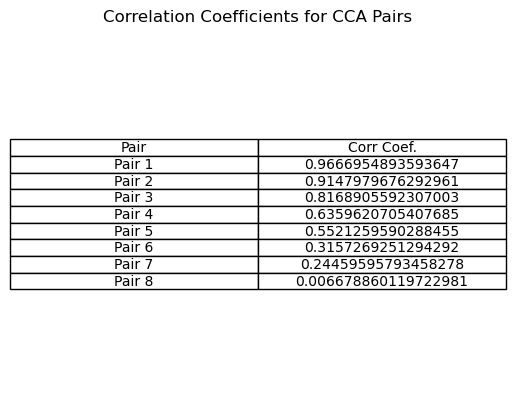

In [16]:
from tabulate import tabulate as tb
import matplotlib.pyplot as plt

CCAresultPccorr = []
for p in range(np.shape(X_c)[1]):
    corr = np.corrcoef(X_c[:, p], Y_c[:, p])[0, 1]
    CCAresultPccorr.append(('Pair %d' % (p+1), corr))

# create a table with the results
headers = ['Pair', 'Corr Coef.']
table = tb(CCAresultPccorr, headers=headers, tablefmt='pipe')

# save the table as an image
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.axis('off')
ax.axis('tight')
table_data = [['Pair', 'Corr Coef.']] + CCAresultPccorr
ax.table(cellText=table_data, colLabels=None, cellLoc='center', loc='center')
plt.title('Correlation Coefficients for CCA Pairs')
plt.savefig('correlation_table.jpg', dpi=400)

# save the table as an Excel file
df = pd.DataFrame(CCAresultPccorr, columns=headers)
df.to_excel('CCA_correlation_Pairs_ERA5_.xlsx', index=False)


In [17]:
#select the 8 individual time series from each pair 
rezcca=cc_res.to_xarray()
PC1sst=rezcca['CCX_1']
PC1sic=rezcca['CCY_1']
PC2sst=rezcca['CCX_2']
PC2sic=rezcca['CCY_2']
PC3sst=rezcca['CCX_3']
PC3sic=rezcca['CCY_3']
PC4sst=rezcca['CCX_4']
PC4sic=rezcca['CCY_4']
PC5sst=rezcca['CCX_5']
PC5sic=rezcca['CCY_5']
PC6sst=rezcca['CCX_6']
PC6sic=rezcca['CCY_6']
PC7sst=rezcca['CCX_7']
PC7sic=rezcca['CCY_7']
PC8sst=rezcca['CCX_8']
PC8sic=rezcca['CCY_8']

#reindex the time axis in the PCs
PC1sst= PC1sst.rename({"index": "time"})
PC2sst= PC2sst.rename({"index": "time"})
PC3sst= PC3sst.rename({"index": "time"})
PC4sst= PC4sst.rename({"index": "time"})
PC5sst= PC5sst.rename({"index": "time"})
PC6sst= PC6sst.rename({"index": "time"})
PC7sst= PC7sst.rename({"index": "time"})
PC8sst= PC8sst.rename({"index": "time"})

PC1sic= PC1sic.rename({"index": "time"})
PC2sic= PC2sic.rename({"index": "time"})
PC3sic= PC3sic.rename({"index": "time"})
PC4sic= PC4sic.rename({"index": "time"})
PC5sic= PC5sic.rename({"index": "time"})
PC6sic= PC6sic.rename({"index": "time"})
PC7sic= PC7sic.rename({"index": "time"})
PC8sic= PC8sic.rename({"index": "time"})

PC1sst['time'] = ds1.time
PC2sst['time'] = ds1.time
PC3sst['time'] = ds1.time
PC4sst['time'] = ds1.time
PC5sst['time'] = ds1.time
PC6sst['time'] = ds1.time
PC7sst['time'] = ds1.time
PC8sst['time'] = ds1.time


PC1sic['time'] = ds2.time
PC2sic['time'] = ds2.time
PC3sic['time'] = ds2.time
PC4sic['time'] = ds2.time
PC5sic['time'] = ds2.time
PC6sic['time'] = ds2.time
PC7sic['time'] = ds2.time
PC8sic['time'] = ds2.time


***Obtain the spatial structures of each CCA pair through linear regression analysis of reconstructed SST/SIC fields on time series from each pair***

In [18]:
regSST1 = xr.cov(PC1sst.load(), ds1.sst.load(), dim="time")/PC1sst.var(dim='time',skipna=True).values
regSST2 = xr.cov(PC2sst.load(), ds1.sst.load(), dim="time")/PC2sst.var(dim='time',skipna=True).values
regSST3 = xr.cov(PC3sst.load(), ds1.sst.load(), dim="time")/PC3sst.var(dim='time',skipna=True).values
regSST4 = xr.cov(PC4sst.load(), ds1.sst.load(), dim="time")/PC4sst.var(dim='time',skipna=True).values
regSST5 = xr.cov(PC5sst.load(), ds1.sst.load(), dim="time")/PC5sst.var(dim='time',skipna=True).values
regSST6 = xr.cov(PC6sst.load(), ds1.sst.load(), dim="time")/PC6sst.var(dim='time',skipna=True).values
regSST7 = xr.cov(PC7sst.load(), ds1.sst.load(), dim="time")/PC7sst.var(dim='time',skipna=True).values
regSST8 = xr.cov(PC8sst.load(), ds1.sst.load(), dim="time")/PC8sst.var(dim='time',skipna=True).values

regSIC1 = xr.cov(PC1sic.load(), ds2.sic.load(), dim="time")/PC1sic.var(dim='time',skipna=True).values
regSIC2 = xr.cov(PC2sic.load(), ds2.sic.load(), dim="time")/PC2sic.var(dim='time',skipna=True).values
regSIC3 = xr.cov(PC3sic.load(), ds2.sic.load(), dim="time")/PC3sic.var(dim='time',skipna=True).values
regSIC4 = xr.cov(PC4sic.load(), ds2.sic.load(), dim="time")/PC4sic.var(dim='time',skipna=True).values
regSIC5 = xr.cov(PC5sic.load(), ds2.sic.load(), dim="time")/PC5sic.var(dim='time',skipna=True).values
regSIC6 = xr.cov(PC6sic.load(), ds2.sic.load(), dim="time")/PC6sic.var(dim='time',skipna=True).values
regSIC7 = xr.cov(PC7sic.load(), ds2.sic.load(), dim="time")/PC7sic.var(dim='time',skipna=True).values
regSIC8 = xr.cov(PC8sic.load(), ds2.sic.load(), dim="time")/PC8sic.var(dim='time',skipna=True).values

***Obtain the variance explained by each spatial structures (as average of r squared), through corelation analysis between the CCA time series from each pair and the SST/SIC fields, reconstructed based on the first 8 EOFs***

In [19]:
# Obtain the percentage of variance explained by each SST structure

cor_SST1 = xr.corr(PC1sst.load(), ds1.sst.load(), dim="time")
r1_squared = cor_SST1*cor_SST1
var_sst1=(r1_squared.mean()*100)
var_sst1_round=var_sst1.round(decimals=1)
print(var_sst1_round)

cor_SST2 = xr.corr(PC2sst.load(), ds1.sst.load(), dim="time")
r2_squared = cor_SST2*cor_SST2
var_sst2=r2_squared.mean()*100
var_sst2_round=var_sst2.round(decimals=1)
print(var_sst2_round)

cor_SST3 = xr.corr(PC3sst.load(), ds1.sst.load(), dim="time")
r3_squared = cor_SST3*cor_SST3
var_sst3=r3_squared.mean()*100
var_sst3_round=var_sst3.round(decimals=1)
print(var_sst3_round)

cor_SST4 = xr.corr(PC4sst.load(), ds1.sst.load(), dim="time")
r4_squared = cor_SST4*cor_SST4
var_sst4=r4_squared.mean()*100
var_sst4_round=var_sst4.round(decimals=1)
print(var_sst4_round)

cor_SST5 = xr.corr(PC5sst.load(), ds1.sst.load(), dim="time")
r5_squared = cor_SST5*cor_SST5
var_sst5=r5_squared.mean()*100
var_sst5_round=var_sst5.round(decimals=1)
print(var_sst5_round)

cor_SST6 = xr.corr(PC6sst.load(), ds1.sst.load(), dim="time")
r6_squared = cor_SST6*cor_SST6
var_sst6=r6_squared.mean()*100
var_sst6_round=var_sst6.round(decimals=1)
print(var_sst6_round)

cor_SST7 = xr.corr(PC7sst.load(), ds1.sst.load(), dim="time")
r7_squared = cor_SST7*cor_SST7
var_sst7=r7_squared.mean()*100
var_sst7_round=var_sst7.round(decimals=1)
print(var_sst7_round)

cor_SST8 = xr.corr(PC8sst.load(), ds1.sst.load(), dim="time")
r8_squared = cor_SST8*cor_SST8
var_sst8=r8_squared.mean()*100
var_sst8_round=var_sst8.round(decimals=1)
print(var_sst8_round)

<xarray.DataArray ()> Size: 8B
array(46.1)
<xarray.DataArray ()> Size: 8B
array(18.2)
<xarray.DataArray ()> Size: 8B
array(10.4)
<xarray.DataArray ()> Size: 8B
array(5.2)
<xarray.DataArray ()> Size: 8B
array(5.3)
<xarray.DataArray ()> Size: 8B
array(5.2)
<xarray.DataArray ()> Size: 8B
array(5.)
<xarray.DataArray ()> Size: 8B
array(4.6)


In [20]:
# Calculate and print the correlation and variance explained for the Arctic and Antarctic SIC spatial structures of each CCA pair
def calculate_correlation_variance(pc_series, sic_data, hemisphere_prefix):
    cor_sic = xr.corr(pc_series.load(), sic_data.sic.load(), dim="time")
    r_squared_sic = cor_sic ** 2
    var_sic = r_squared_sic.mean() * 100
    var_sic_round = var_sic.round(decimals=2)
    print(f"{hemisphere_prefix}_SIC Variance Explained: {var_sic_round}%")

# Selecting Northern and Southern Hemisphere data
northern_hemisphere_data = ds2.sel(latitude=slice(30, 90))
southern_hemisphere_data = ds2.sel(latitude=slice(-90, -30))

# Calculate correlations and variances for each PC series for both hemispheres
for i in range(1, 9):
    pc_series = globals()[f'PC{i}sic']  # Dynamically get the PC series variable
    calculate_correlation_variance(pc_series, northern_hemisphere_data, f"north_PC{i}")
    calculate_correlation_variance(pc_series, southern_hemisphere_data, f"south_PC{i}")

north_PC1_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(61.14)%
south_PC1_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(29.03)%
north_PC2_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(10.73)%
south_PC2_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(13.48)%
north_PC3_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(2.97)%
south_PC3_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(13.11)%
north_PC4_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(5.02)%
south_PC4_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(9.18)%
north_PC5_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(11.17)%
south_PC5_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(7.83)%
north_PC6_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(3.33)%
south_PC6_SIC Variance Explained: <xarray.DataArray ()> Size: 8B
array(13.05)%
north_PC7_SIC Variance Explained: <xarray.DataArray ()> S

In [21]:
north_variances = [61.04, 10.79, 2.97, 5.00, 11.22, 3.35, 2.58, 3.05]
south_variances = [29.12, 13.41, 13.11, 9.14, 7.85, 13.06, 7.78, 6.53]

In [22]:
import pandas as pd

# Creating a DataFrame with the actual variance explained
df = pd.DataFrame({
    "Variance Explained": ["PC1_SIC", "PC2_SIC", "PC3_SIC", "PC4_SIC", "PC5_SIC", "PC6_SIC", "PC7_SIC", "PC8_SIC"],
    "North (%)": north_variances,
    "South (%)": south_variances
})

# Save the DataFrame to a CSV file
df.to_csv("CCA__ERA_variance_explained_SIC_pairs.csv", index=False)

***PLOT CCA PAIRS***

***Pair 1***

In [23]:
import cartopy.util as cutil
import numpy as np
import matplotlib.colors as mcolors

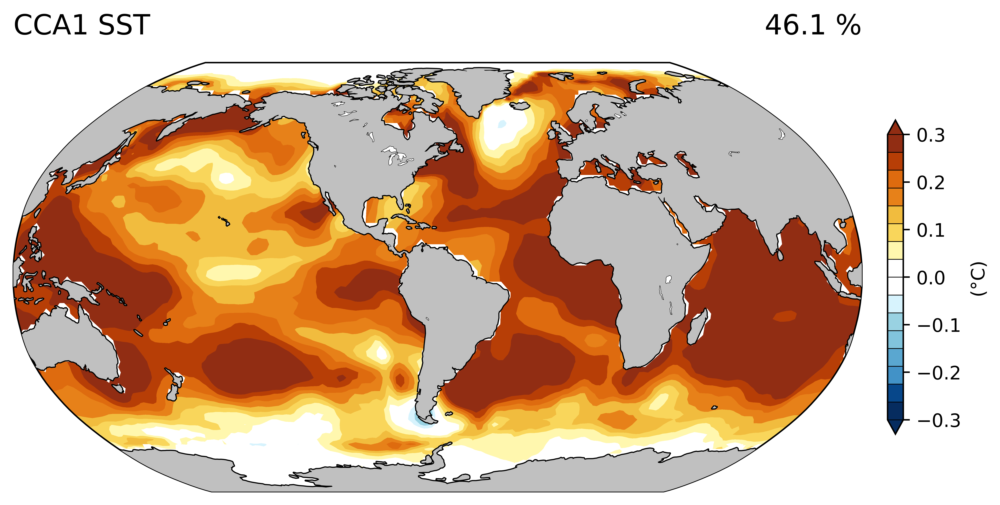

In [24]:
#SST

fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(regSST1, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA1 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst1_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("CCA.SST1.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_1a_ERA5_CCA.SST1_CO2.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()


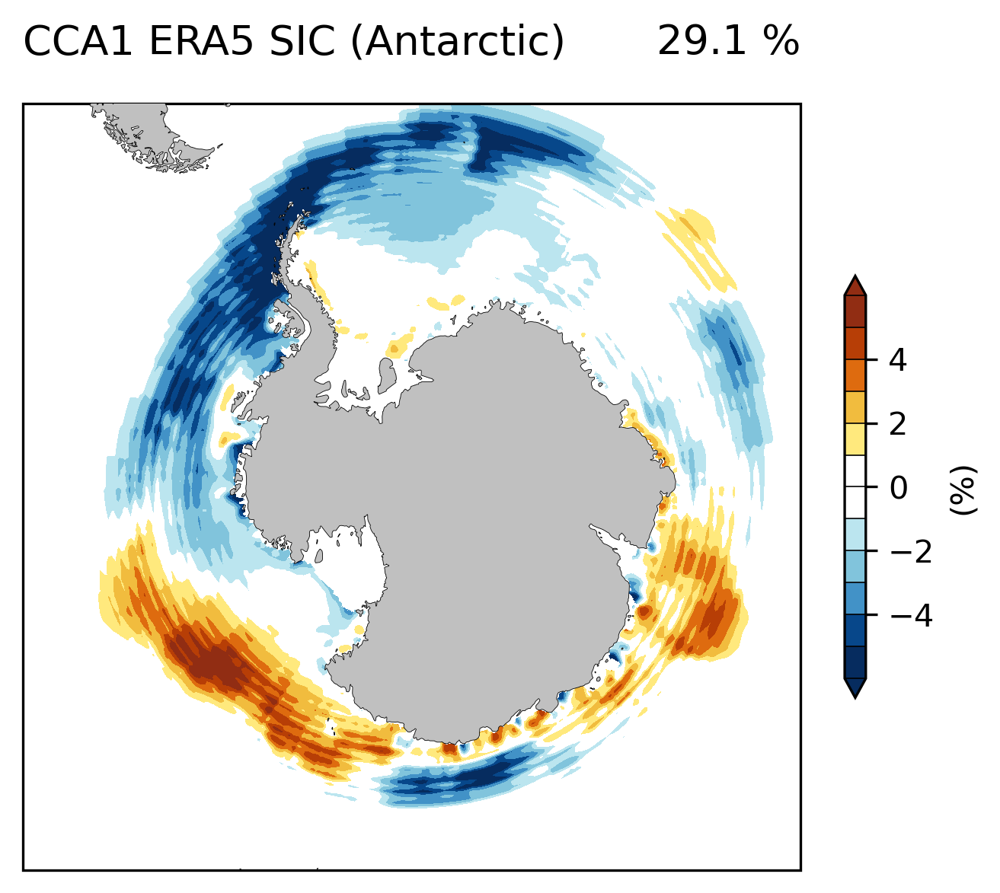

In [25]:
# Antarctic SIC

# Mask Northern Hemisphere SIC
regSIC1_masked = regSIC1.where(regSIC1.latitude < -50)

# Custom colormap from BlueYellowRed with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize/1, level_max + stepsize/1 + stepsize, stepsize)

# Create plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=300, subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA1 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='29.1 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot contourf
cf = ax.contourf(
    regSIC1_masked.longitude,
    regSIC1_masked.latitude,
    regSIC1_masked * 100,  # scaled to percent
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save and show
plt.savefig("Figure_1d_ERA5_P1_CCA.SIC1_CO2_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

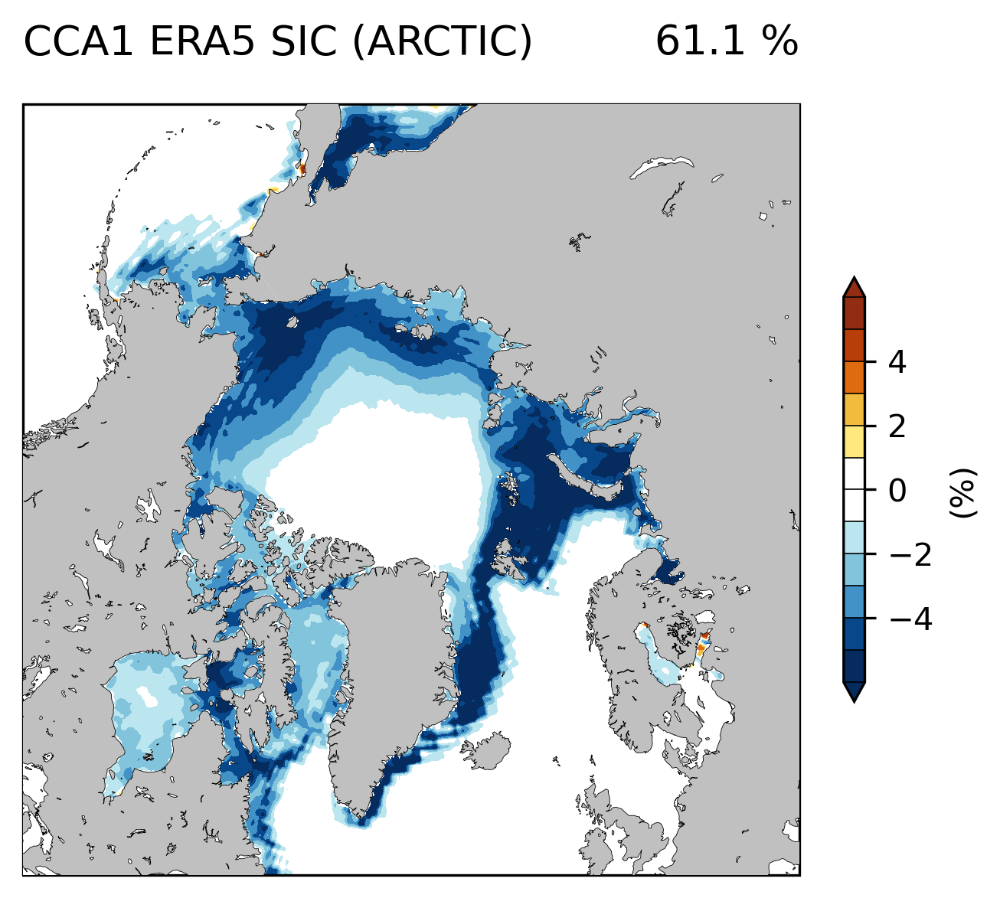

In [26]:
# Arctic_SIC

regSIC1_masked = regSIC1.where(regSIC1.latitude > 50)

# Custom colormap from BlueYellowRed with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize/1, level_max + stepsize/1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})

# Set visible map extent (Arctic region)
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2,
               facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA1 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle=f'{61.1} %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC1_masked.longitude,
    regSIC1_masked.latitude,
    regSIC1_masked * 100,
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save and display
#plt.savefig("CCA.SIC1_ARCTIC.pdf", format="pdf", bbox_inches='tight', dpi=600)
plt.savefig("Figure_1c_ERA5_P1_CCA.SIC1_CO2_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

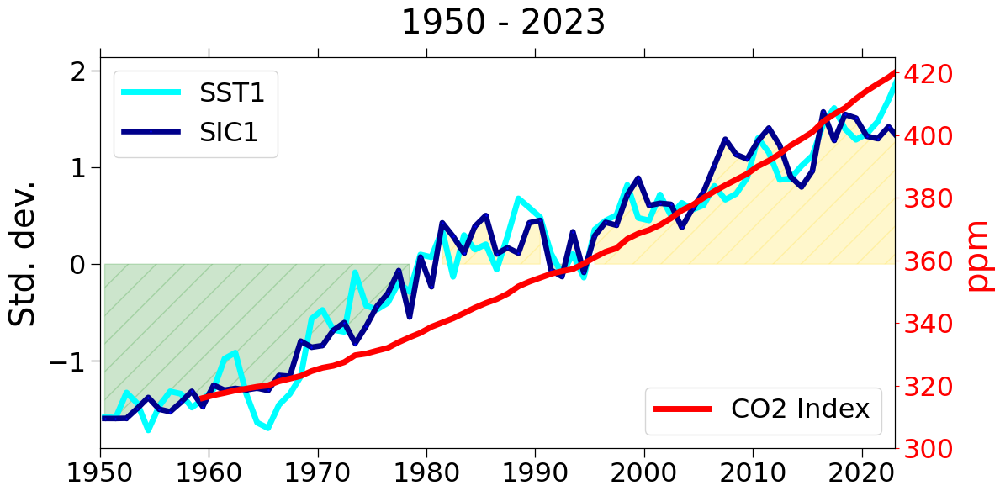

In [27]:
import matplotlib.dates as mdates

# Load CO2 data from co2_annmean_mlo.csv
co2_data = pd.read_csv("co2_annmean_mlo.csv")

# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                            1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, PC1sst, color='aqua', linewidth=5, label='SST1')
ax1.plot(ds1.time, PC1sic, marker='o', markerfacecolor='blue', markersize=2.8, color='darkblue', linewidth=4.75, label='SIC1')
ax1.fill_between(ds1.time, PC1sic, where=PC1sic > 0, color='gold', alpha=0.2, hatch='/')
ax1.fill_between(ds1.time, PC1sic, where=PC1sic < 0, color='green', alpha=0.2, hatch='/')
ax1.legend(prop={"size": 23})

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))

# Create secondary y-axis for CO2 data
ax2 = ax1.twinx()
ax2.plot(ds1.time, co2_data['mean'], color='red', linewidth=5, label='CO2 Index')
ax2.set_ylabel('ppm', fontsize=29, color='red')
ax2.tick_params(axis='y', colors='red', labelsize=23)  # Set label font size
ax2.set_ylim(300, 425)  # Adjust the limits as needed
ax2.legend(prop={"size": 23}, loc='lower right')

# Adjust layout and display the plot

#plt.savefig("FCCA.PC1.pdf", format="pdf", bbox_inches='tight', dpi= 600)
plt.savefig("Figure_1b_ERA5_CCA2.Time_Series_CO2.jpg", format="jpg", bbox_inches='tight', dpi= 600)
plt.tight_layout()
plt.show()

***Pair 2***

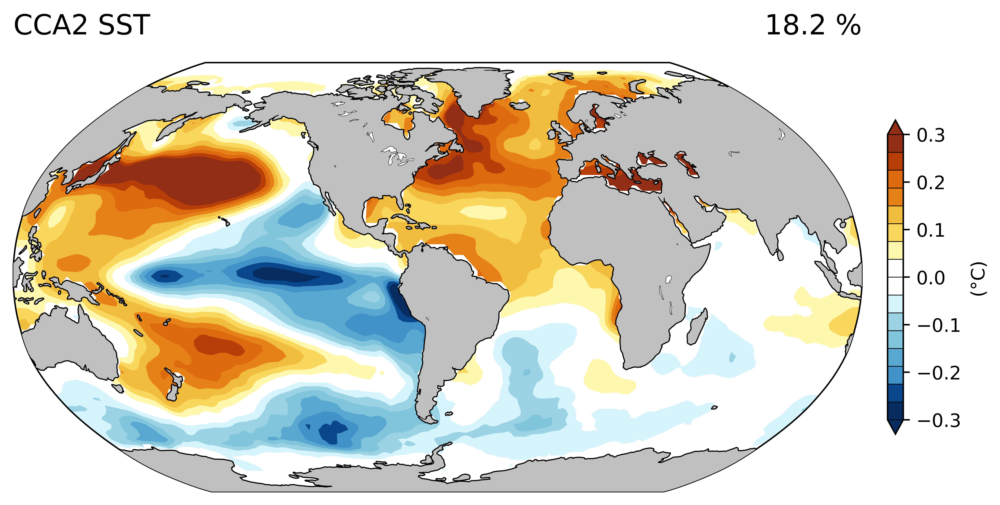

In [28]:
import cartopy.util as cutil
import numpy as np
import matplotlib.colors as mcolors

fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(regSST2, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'],- data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA2 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst2_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("CCA.SST2.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_2a_ERA5_CCA.SST2_AMO.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

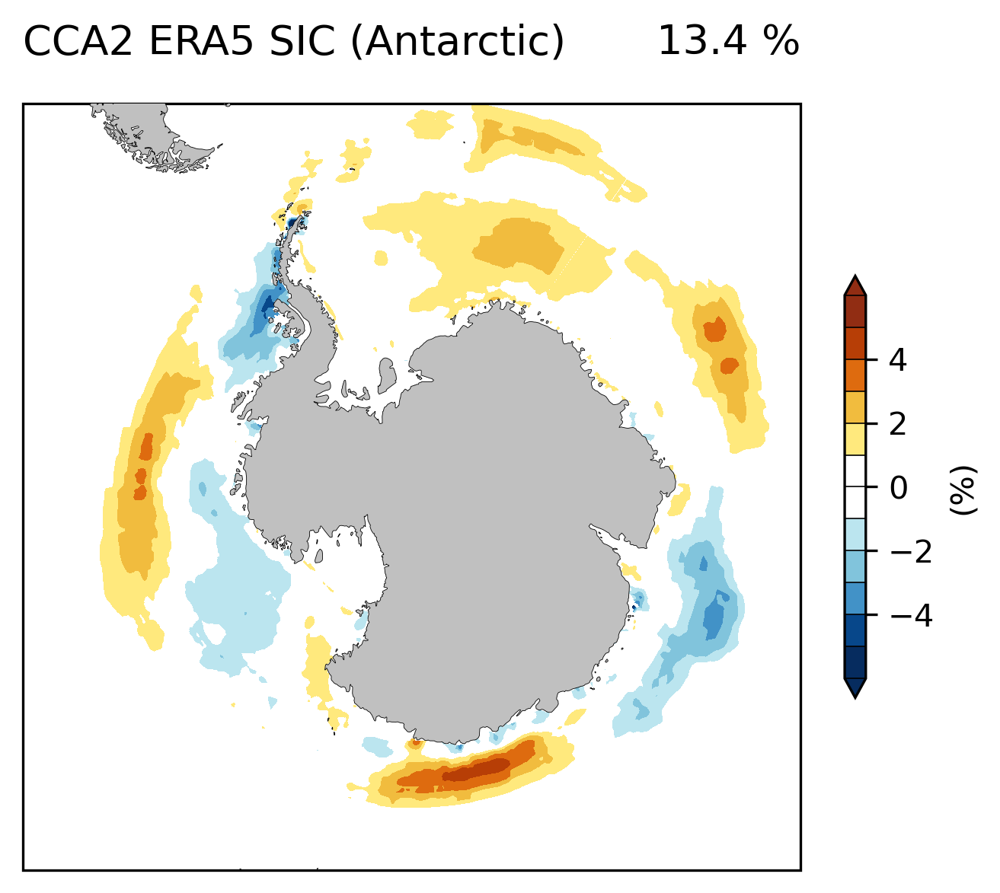

In [29]:
# Antarctic SIC
# Mask Northern Hemisphere SIC for Antarctic view
regSIC2_masked = regSIC2.where(regSIC2.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create plot
fig, ax = plt.subplots(figsize=(8, 4), dpi=300, subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Add background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA2 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='13.4 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot filled contours
cf = ax.contourf(
    regSIC2_masked.longitude,
    regSIC2_masked.latitude,
    -regSIC2_masked * 100,
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save and show
plt.savefig("Figure_2d_ERA5_CCA.SIC2_AMO_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

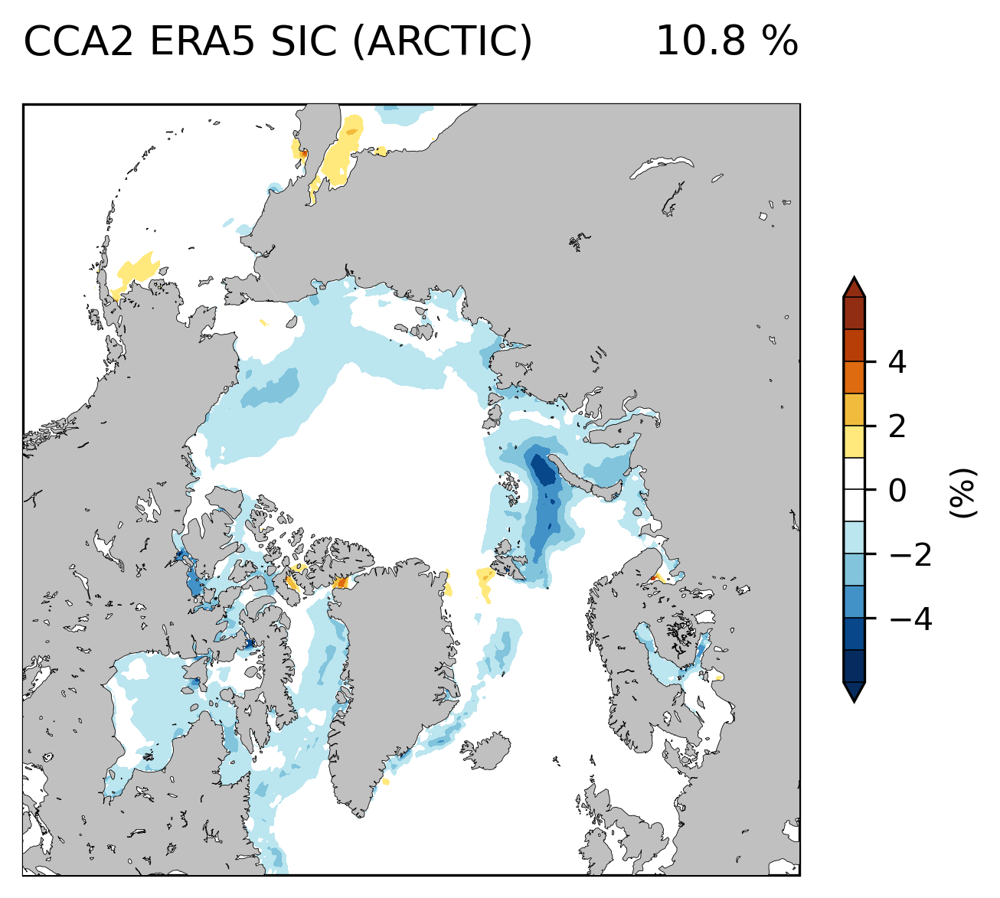

In [30]:
# Arctic_SIC

# Antarctic SIC mask
regSIC2_masked = regSIC2.where(regSIC2.latitude > 50)

# Custom colormap from BlueYellowRed with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize/1, level_max + stepsize/1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})

# Set visible map extent (Arctic region)
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2,
               facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA2 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle=f'{10.8} %',  # Replace with correct variance
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC2_masked.longitude,
    regSIC2_masked.latitude,
    -regSIC2_masked * 100,
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save and display
#plt.savefig("CCA.SIC2_ARCTIC.pdf", format="pdf", bbox_inches='tight', dpi=600)
plt.savefig("Figure_2c_ERA5_CCA.SIC2_AMO_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

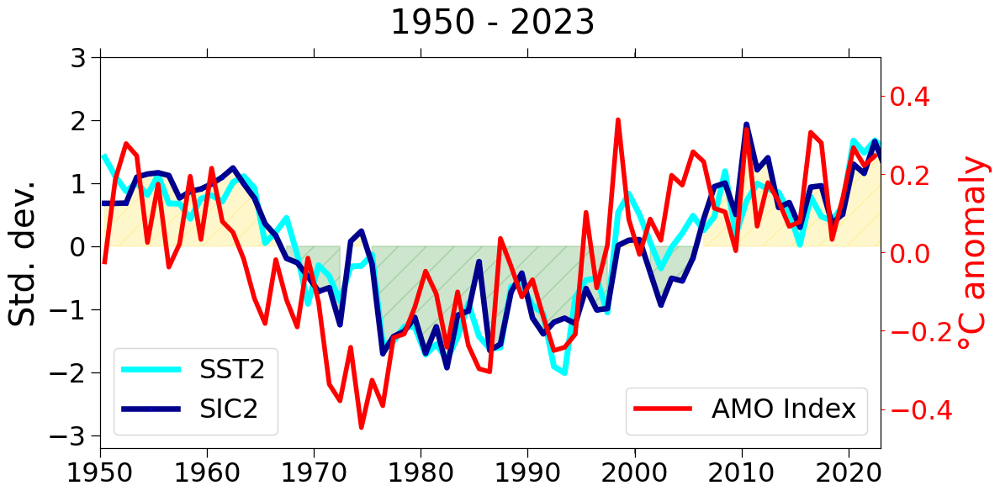

In [31]:
#Time Series 
amo_data = pd.read_excel("Annual_Mean_AMO_Index_Short_NOAA_1950_2023.xlsx")

# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, -PC2sst, color='aqua', linewidth=5, label='SST2')
ax1.plot(ds1.time, -PC2sic, marker='o', markerfacecolor='blue', markersize=2.8, color='darkblue', linewidth=4.75, label='SIC2')
ax1.fill_between(ds1.time, -PC2sic, where=-PC2sic > 0, color='gold', alpha=0.2, hatch='/')
ax1.fill_between(ds1.time, -PC2sic, where=-PC2sic < 0, color='green', alpha=0.2, hatch='/')
ax1.set_ylim(-3.2, 3)  
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))

# Create secondary y-axis for AMO data
ax2 = ax1.twinx()
ax2.plot(ds1.time, amo_data['Values'], color='red', linewidth=4, label='AMO Index')
ax2.set_ylabel('°C anomaly', fontsize=29, color='red')
ax2.tick_params(axis='y', colors='red', labelsize=23)  
ax2.set_ylim(-0.5, 0.5)  
ax2.legend(prop={"size": 23}, loc='lower right')

# Adjust layout and display the plot

#plt.savefig("CCA.PC2.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_2b_ERA5_CCA2.Time_Series_AMO.jpg",format="jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

In [33]:
from scipy.stats import pearsonr

In [34]:
# Load the NOAA AMO Index
amo_df = pd.read_excel("Annual_Mean_AMO_Index_Short_NOAA_1950_2023.xlsx")
amo_values = amo_df.iloc[:, 1] 
amo_years = amo_df.iloc[:, 0]  

# Make sure both series are the same length and drop NaNs
df = pd.DataFrame({
    'AMO': amo_values,
    'PC2sst': -PC2sst
}).dropna()

# Compute Pearson correlation
correlation, p_value = pearsonr(df['PC2sst'], df['AMO'])

# Determine significance level
if p_value < 0.01:
    significance_interval = '99% confidence'
elif p_value < 0.05:
    significance_interval = '95% confidence'
else:
    significance_interval = 'No significant correlation'

# Create DataFrame for results
correlation_df = pd.DataFrame({
    'Correlation': [correlation],
    'P-value': [p_value],
    'Significance Interval': [significance_interval]
})

# Output results
print(f"Correlation: {correlation}")
print(f"P-value: {p_value}")
print(f"Significance Interval: {significance_interval}")

Correlation: 0.6847834249044731
P-value: 2.3749978745318217e-11
Significance Interval: 99% confidence


***Pair 3***

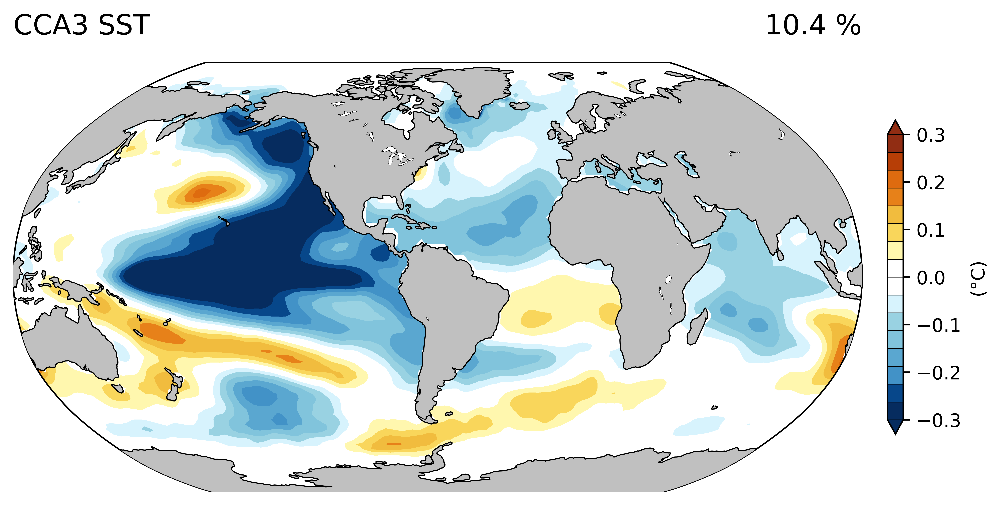

In [35]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_global()
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(-regSST3, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA3 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst3_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("SST3.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_3a_ERA5_CCA.SST3_IPO.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

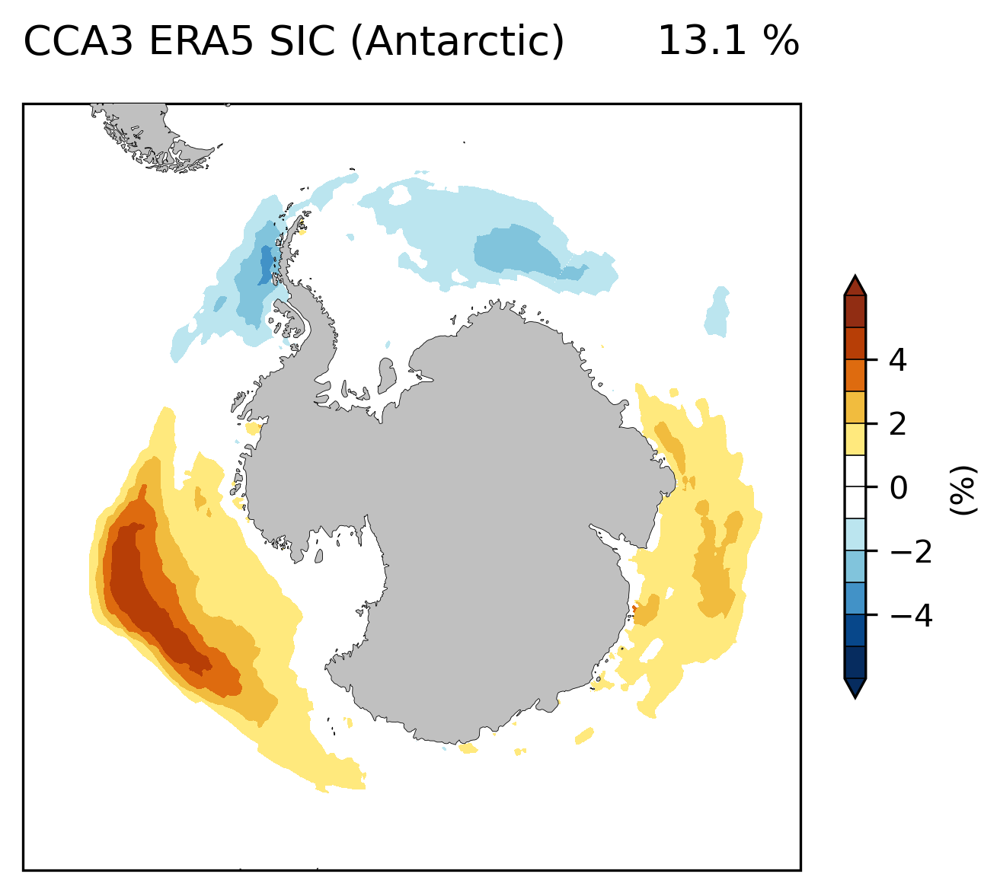

In [36]:
# Mask Northern Hemisphere for Antarctic
regSIC3_masked = regSIC3.where(regSIC3.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA3 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='13.1 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot
cf = ax.contourf(
    regSIC3_masked.longitude,
    regSIC3_masked.latitude,
    -regSIC3_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save
plt.savefig("Figure_3d_ERA5_CCA.SIC3_IPO_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

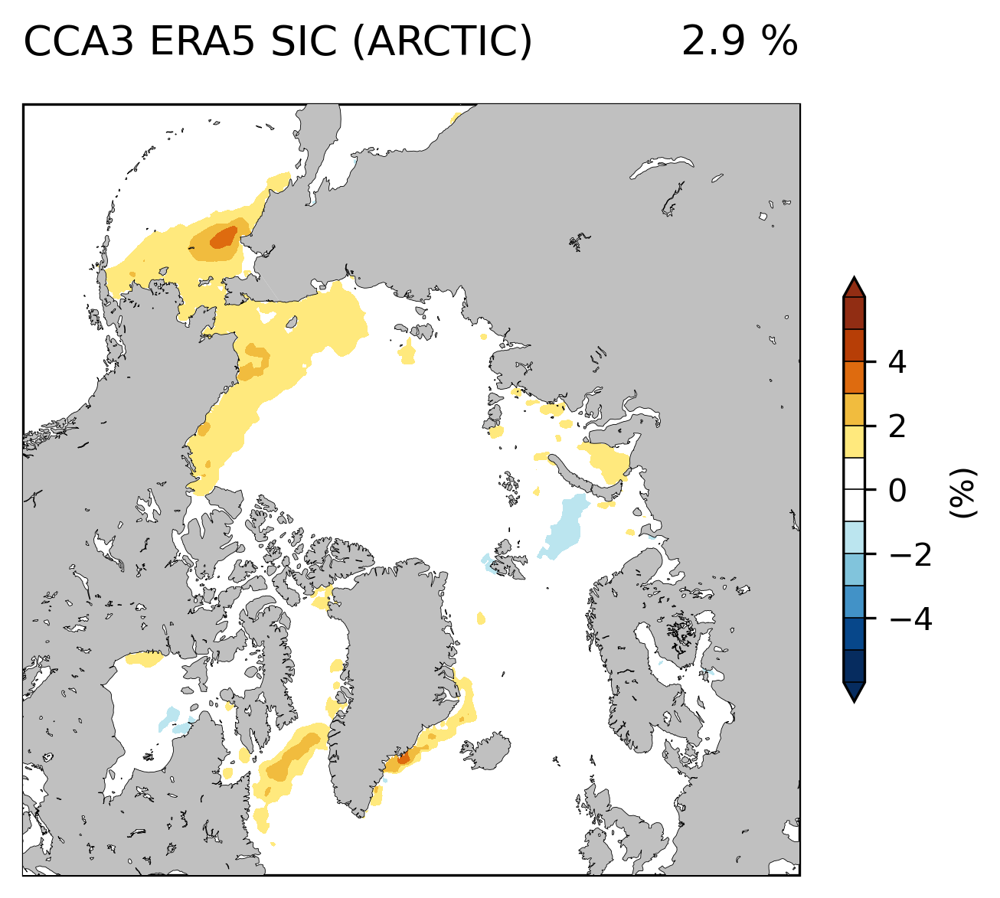

In [37]:
# Arctic SIC 
regSIC3_masked = regSIC3.where(regSIC3.latitude > 50)

# Custom colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA3 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle='2.9 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC3_masked.longitude,
    regSIC3_masked.latitude,
    -regSIC3_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save figure
plt.savefig("Figure_3c_ERA5_CCA.SIC3_IPO_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

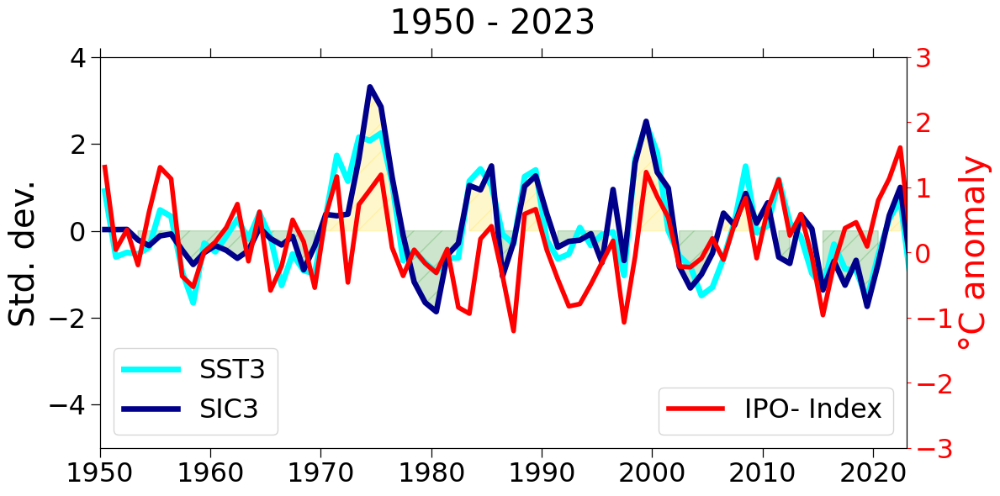

In [38]:
# load data from an Excel file
IPO_data = pd.read_excel("IPO_Index_Unfilred_Tripole_1950_2023.xlsx")

# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, -PC3sst, color='aqua', linewidth=5, label='SST3')
ax1.plot(ds1.time, -PC3sic, color='darkblue', linewidth=4.75, label='SIC3')
ax1.fill_between(ds1.time,-PC3sic, where=-PC3sic > 0, color='gold', alpha=0.2, hatch='/')
ax1.fill_between(ds1.time, -PC3sic, where=-PC3sic < 0, color='green', alpha=0.2, hatch='/')
ax1.set_ylim(-5, 4)  # Adjust the limits as needed
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))

# Create secondary y-axis for AMO data
ax2 = ax1.twinx()
ax2.plot(ds1.time, -IPO_data['Values'], color='red', linewidth=4, label='IPO- Index')
ax2.set_ylabel('°C anomaly', fontsize=29, color='red')
ax2.tick_params(axis='y', colors='red', labelsize=23)  # Set label font size
ax2.set_ylim(-3, 3)  # Adjust the limits as needed
ax2.legend(prop={"size": 23}, loc='lower right')

# Adjust layout and display the plot

#plt.savefig("CCA.PC3.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_3b_ERA5_CCA3.Time_Series_IPO.jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

In [39]:
# Correct way to load data from an Excel file
IPO_Index = pd.read_excel("IPO_Index_Unfilred_Tripole_1950_2023.xlsx")

# Extract the "Values" column
IPO_values = IPO_Index.iloc[:, 1]  # Second column (index 1)

# Perform Pearson correlation analysis
correlation, p_value = pearsonr(-PC3sst, -IPO_values)

# Determine significance level
if p_value < 0.01:
    significance_interval = '99% confidence'
elif p_value < 0.1:
    significance_interval = '90% confidence'
else:
    significance_interval = 'No significant correlation'

# Create a DataFrame to store the correlation analysis results
correlation_df = pd.DataFrame({
    'Correlation': [correlation],
    'P-value': [p_value],
    'Significance Interval': [significance_interval]
})

# Print the results
print(f"Correlation: {correlation}")
print(f"P-value: {p_value}")
print(f"Significance Interval: {significance_interval}")

Correlation: 0.550042915065997
P-value: 3.848311463650015e-07
Significance Interval: 99% confidence


***Pair 4***

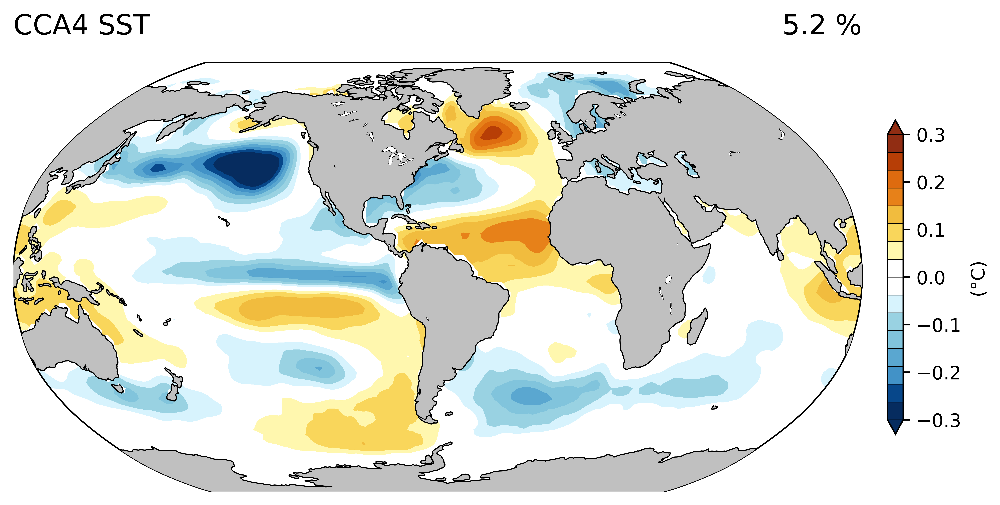

In [40]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_global()
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(-regSST4, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA4 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst4_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("SST3.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_S3a_ERA5_CCA.SST4.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

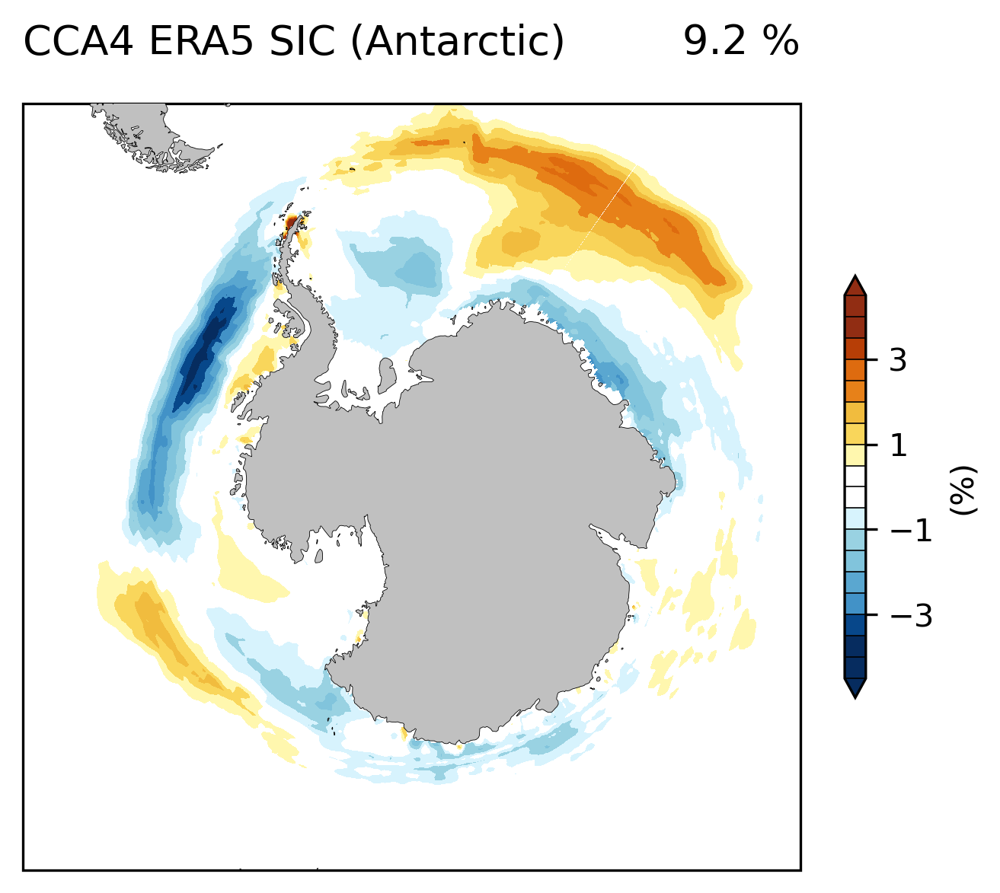

In [41]:
# Mask Northern Hemisphere for Antarctic
regSIC4_masked = regSIC4.where(regSIC4.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -4
level_max = 4
stepsize = 0.5
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA4 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='9.2 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot
cf = ax.contourf(
    regSIC4_masked.longitude,
    regSIC4_masked.latitude,
    -regSIC4_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save
plt.savefig("Figure_S3f_ERA5_CCA.SIC4_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

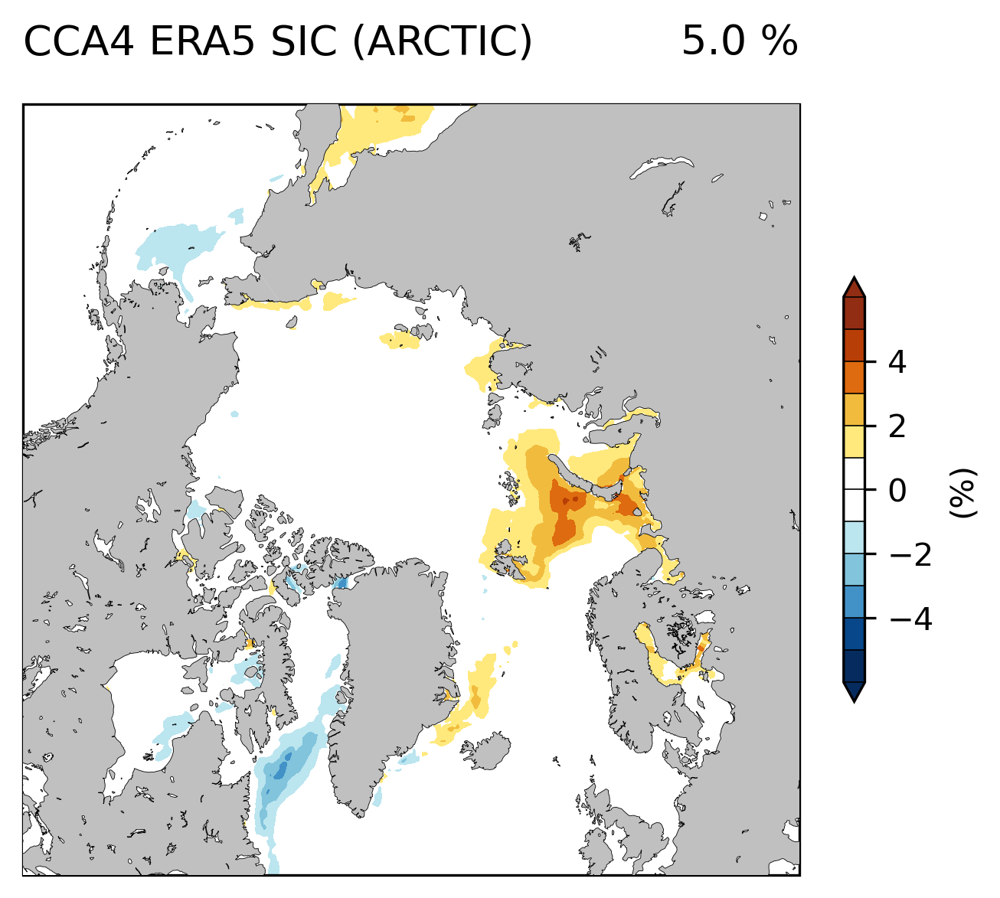

In [42]:
# Arctic SIC 
regSIC4_masked = regSIC4.where(regSIC4.latitude > 50)

# Custom colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA4 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle='5.0 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC4_masked.longitude,
    regSIC4_masked.latitude,
    -regSIC4_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save figure
plt.savefig("Figure_S3e_ERA5_CCA.SIC4_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

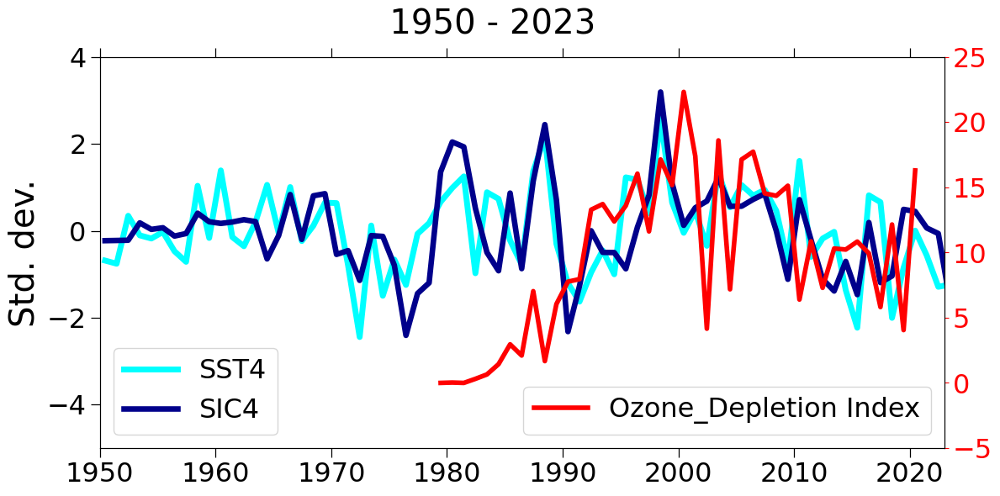

In [43]:
# load data from an Excel file
Ozone_data = pd.read_excel("Ozone_Index_1979_2020_AnnualMeans.xlsx")

# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, -PC4sst, color='aqua', linewidth=5, label='SST4')
ax1.plot(ds1.time, -PC4sic, color='darkblue', linewidth=4.75, label='SIC4')
ax1.set_ylim(-5, 4)  # Adjust the limits as needed
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))

# Create secondary y-axis for AMO data
ax2 = ax1.twinx()
ax2.plot(ds1.time, Ozone_data['Value'], color='red', linewidth=4, label='Ozone_Depletion Index')
#ax2.set_ylabel('°C anomaly', fontsize=29, color='red')
ax2.tick_params(axis='y', colors='red', labelsize=23)  # Set label font size
ax2.set_ylim(-5, 25)  # Adjust the limits as needed
ax2.legend(prop={"size": 23}, loc='lower right')

# Adjust layout and display the plot

#plt.savefig("CCA.PC3.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_S3c_ERA5_CCA4.Time_Series.jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

***Pair 5***

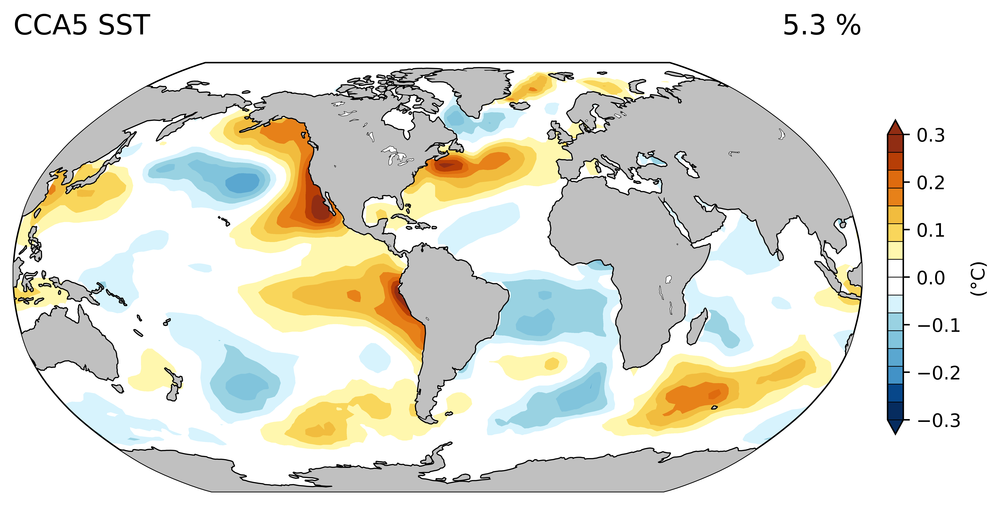

In [44]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_global()
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(-regSST5, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA5 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst5_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("SST3.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_S3b_ERA5_CCA.SST5.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

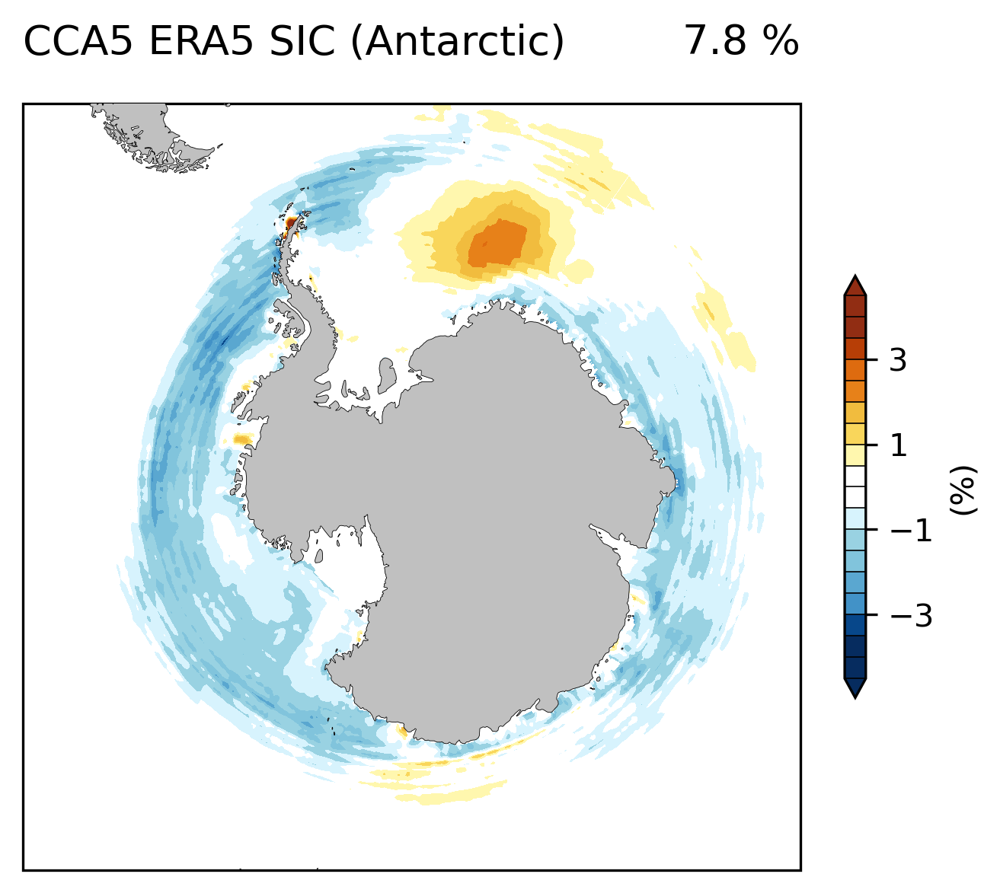

In [45]:
# Mask Northern Hemisphere for Antarctic
regSIC5_masked = regSIC5.where(regSIC5.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -4
level_max = 4
stepsize = 0.5
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA5 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='7.8 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot
cf = ax.contourf(
    regSIC5_masked.longitude,
    regSIC5_masked.latitude,
    -regSIC5_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save
plt.savefig("Figure_S3h_ERA5_CCA.SIC5_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

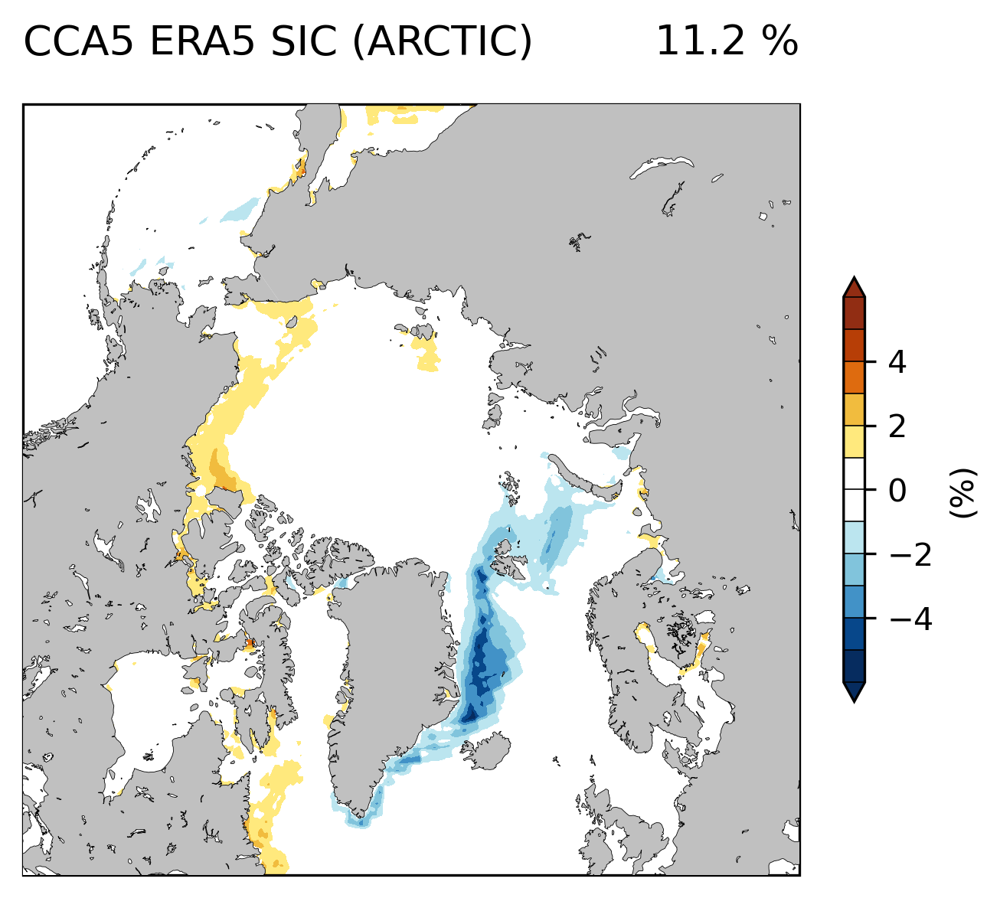

In [46]:
# Arctic SIC 
regSIC5_masked = regSIC5.where(regSIC5.latitude > 50)

# Custom colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA5 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle='11.2 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC5_masked.longitude,
    regSIC5_masked.latitude,
    -regSIC5_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save figure
plt.savefig("Figure_S3g_ERA5_CCA.SIC5_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

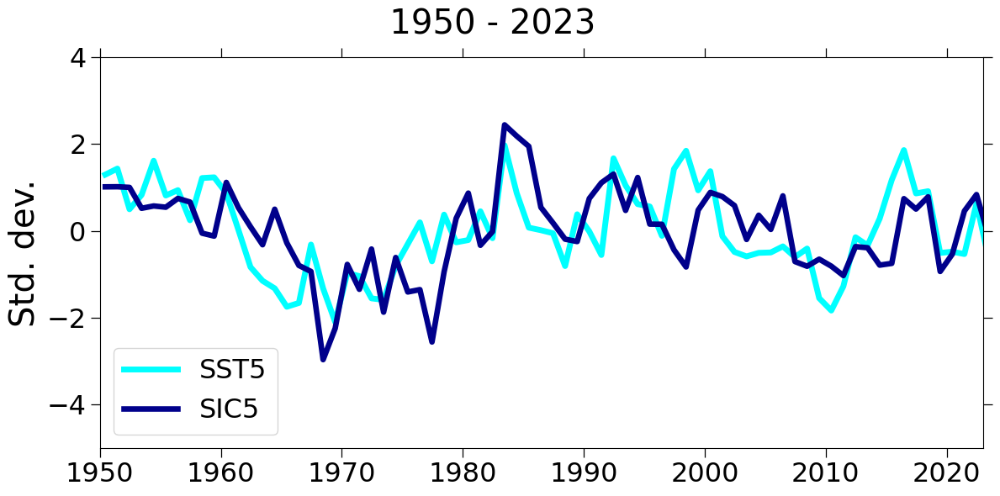

In [47]:
# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, -PC5sst, color='aqua', linewidth=5, label='SST5')
ax1.plot(ds1.time, -PC5sic, color='darkblue', linewidth=4.75, label='SIC5')
ax1.set_ylim(-5, 4)  # Adjust the limits as needed
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))


# Adjust layout and display the plot

#plt.savefig("CCA.PC3.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_S3d_ERA5_CCA5.Time_Series.jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

***Pair 6***

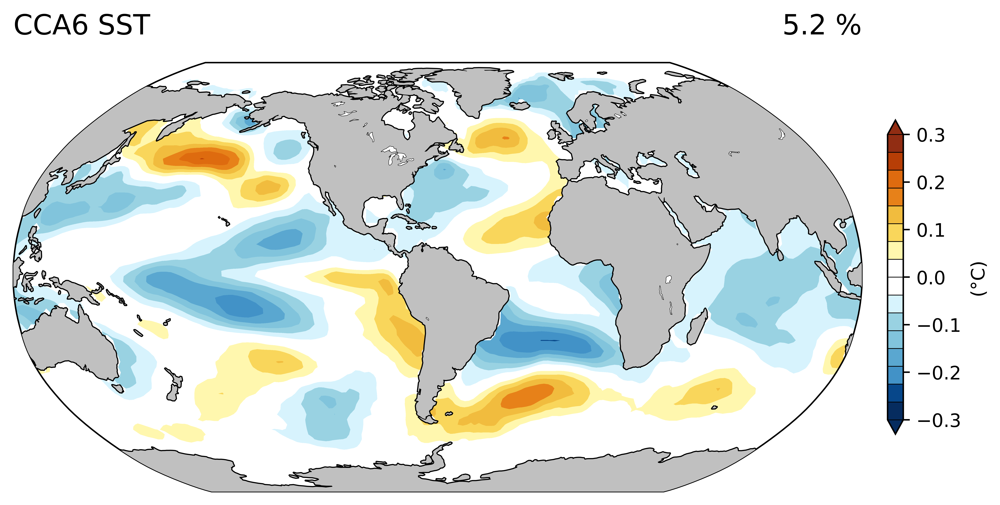

In [48]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_global()
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(-regSST6, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA6 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst6_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("SST3.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_S4a_ERA5_CCA.SST6.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

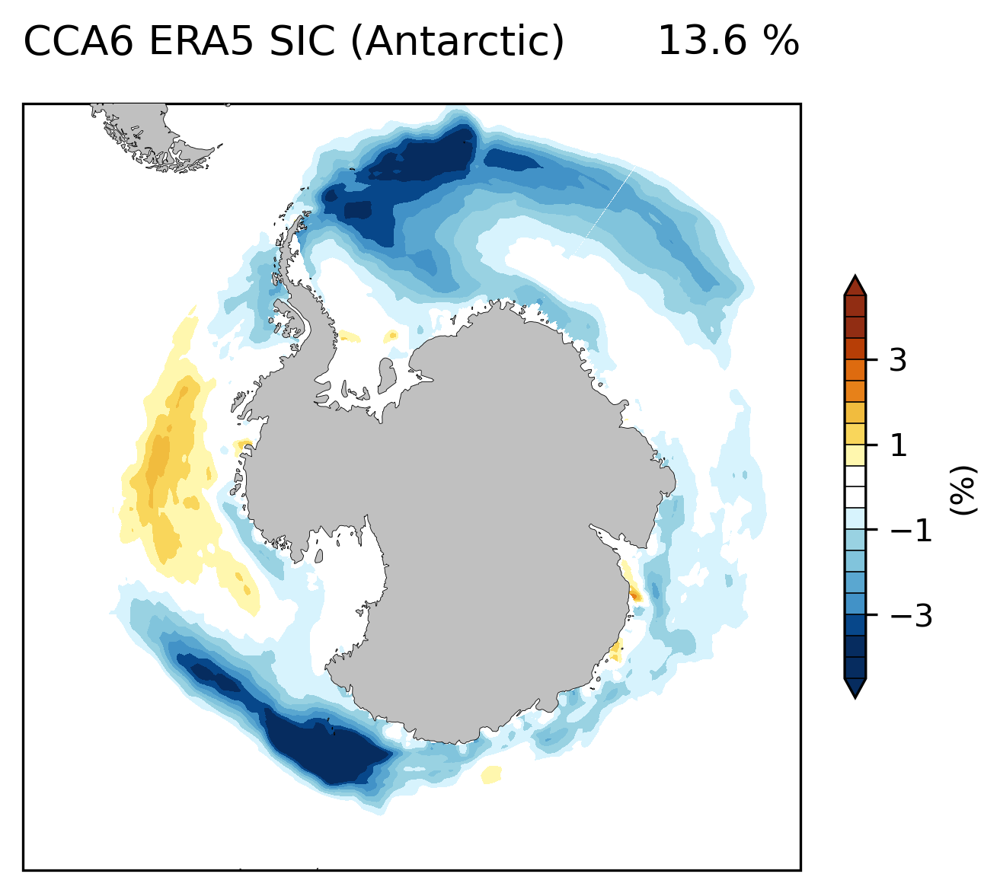

In [49]:
# Mask Northern Hemisphere for Antarctic
regSIC6_masked = regSIC6.where(regSIC6.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -4
level_max = 4
stepsize = 0.5
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA6 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='13.6 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot
cf = ax.contourf(
    regSIC6_masked.longitude,
    regSIC6_masked.latitude,
    -regSIC6_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save
plt.savefig("Figure_S4f_ERA5_CCA.SIC6_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

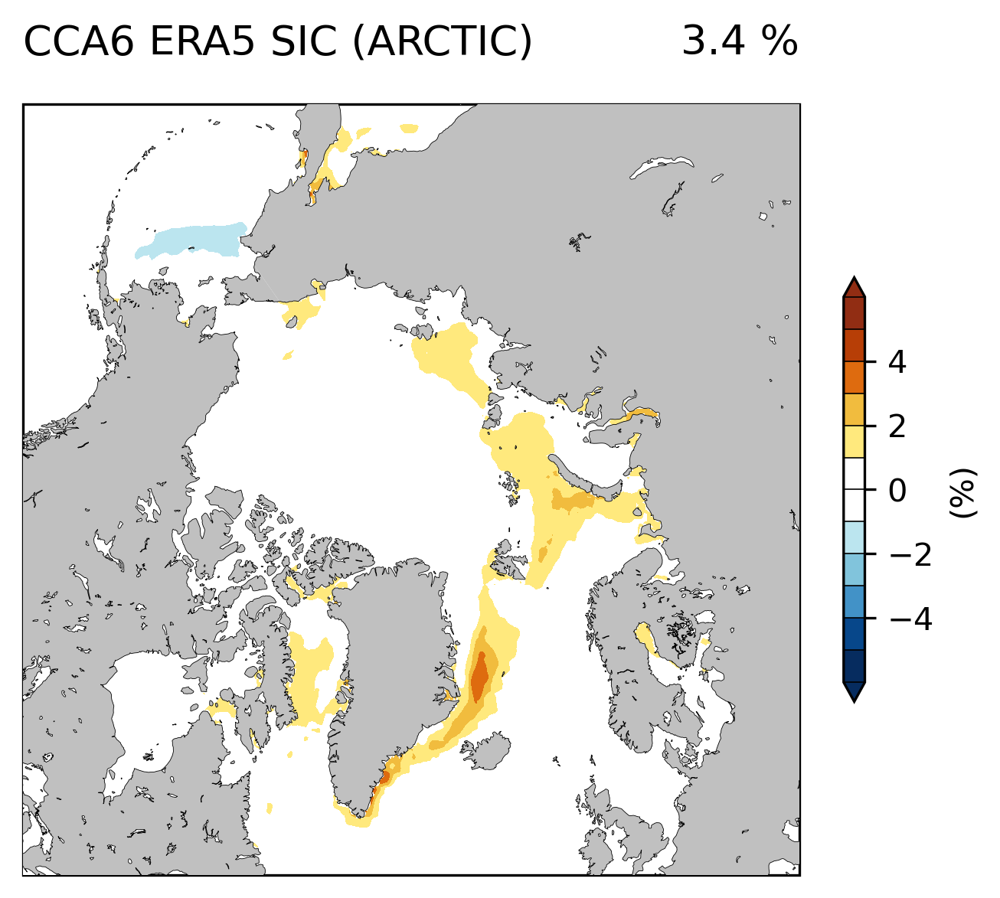

In [50]:
# Arctic SIC 
regSIC6_masked = regSIC6.where(regSIC6.latitude > 50)

# Custom colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -5
level_max = 5
stepsize = 1
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA6 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle='3.4 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC6_masked.longitude,
    regSIC6_masked.latitude,
    -regSIC6_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save figure
plt.savefig("Figure_S4e_ERA5_CCA.SIC6_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

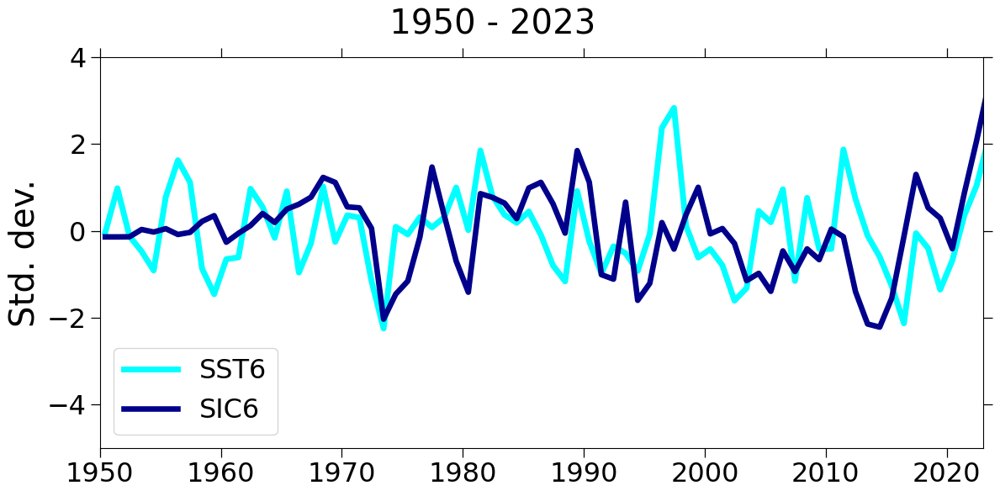

In [51]:
# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, -PC6sst, color='aqua', linewidth=5, label='SST6')
ax1.plot(ds1.time, -PC6sic, color='darkblue', linewidth=4.75, label='SIC6')
ax1.set_ylim(-5, 4)  # Adjust the limits as needed
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))


# Adjust layout and display the plot

#plt.savefig("CCA.PC3.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_S4c_ERA5_CCA6.Time_Series.jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

***Pair 7***

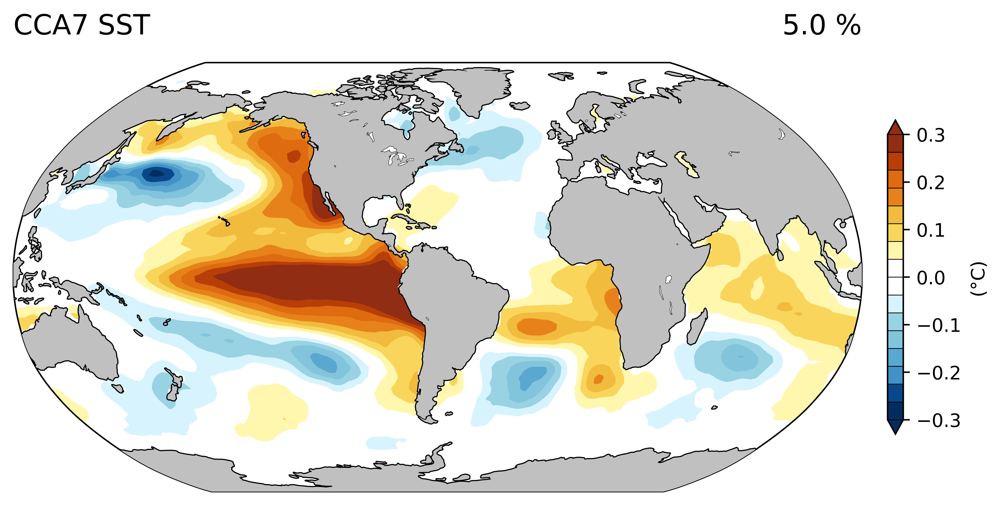

In [52]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=900, subplot_kw={"projection": ccrs.Robinson(central_longitude=-65)})
#ax.set_global()
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m')
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Add cyclic point to data to remove the white line over the 0 meridian
data, lon = cutil.add_cyclic_point(regSST7, coord=ds1['lon'])

# Color scheme
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1., 1., 1.]
color_list[10] = [1., 1., 1.]
cmap = mcolors.ListedColormap(color_list)

# Plot the data using the specified color scheme
cf = ax.contourf(lon, ds1['lat'], data, transform=ccrs.PlateCarree(),
                 cmap=cmap, levels=np.linspace(-0.3, 0.3, 17),
                 vmin=-0.3, vmax=0.3,
                 extend='both')

cax = plt.colorbar(cf, ticks=np.arange(-0.4 + 0.1, 0.4, 0.1), drawedges=True,
                   orientation='vertical', label=r"(°C)", pad=0.025,
                   shrink=0.5, aspect=20)

gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA7 SST ',
                             lefttitlefontsize=15,
                             righttitle=f'{var_sst7_round.values} %',
                             righttitlefontsize=15,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)
#plt.savefig("SST3.10p.pdf", format="pdf", bbox_inches='tight', dpi=900)
plt.savefig("Figure_S4b_ERA5_CCA.SST7.jpg", format="jpg", bbox_inches='tight', dpi=900)
plt.tight_layout()

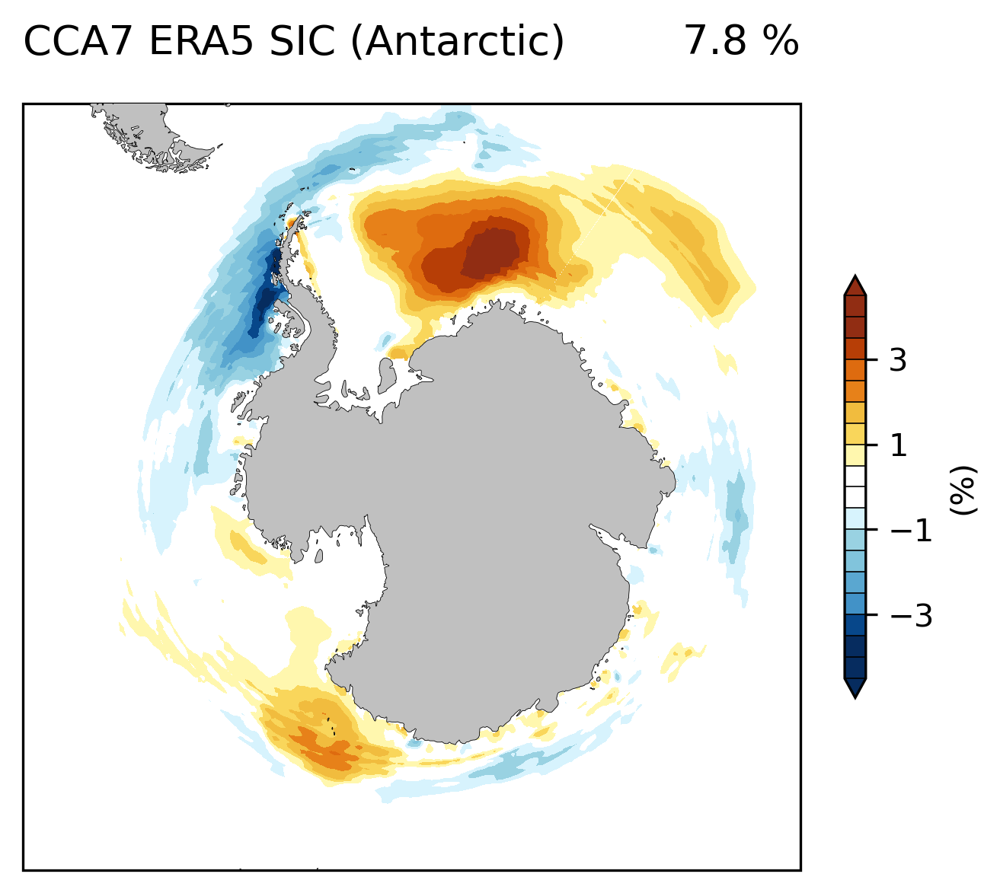

In [53]:
# Mask Northern Hemisphere for Antarctic
regSIC7_masked = regSIC7.where(regSIC7.latitude < -50)

# Custom BlueYellowRed colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -4
level_max = 4
stepsize = 0.5
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.SouthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, -90, -55], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA7 ERA5 SIC (Antarctic)',
                             lefttitlefontsize=13,
                             righttitle='7.8 %',  
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot
cf = ax.contourf(
    regSIC7_masked.longitude,
    regSIC7_masked.latitude,
    regSIC7_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save
plt.savefig("Figure_S4h_ERA5_CCA.SIC7_AA.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

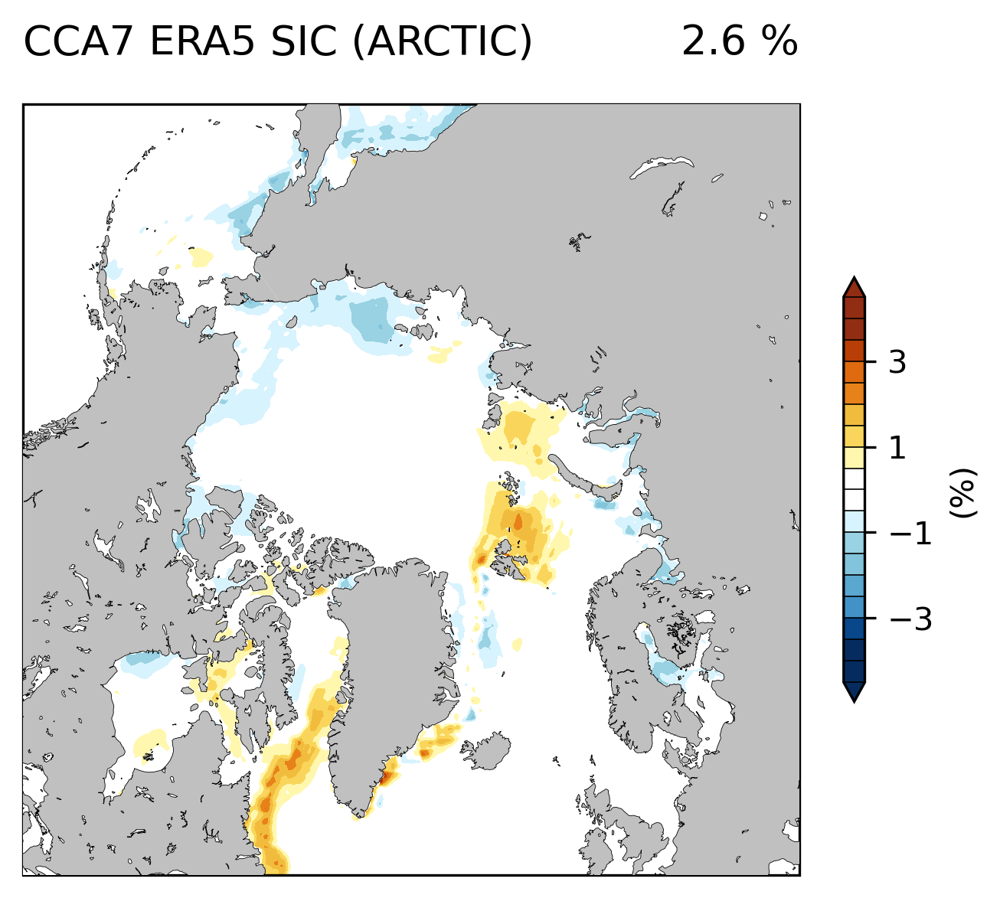

In [54]:
# Arctic SIC 
regSIC7_masked = regSIC7.where(regSIC7.latitude > 50)

# Custom colormap with white at center
newcmp = gvcmaps.BlueYellowRed
index = [5, 20, 35, 50, 65, 85, 95, 110, 125, 0, 0, 135, 150, 165, 180, 200, 210, 220, 235, 250]
color_list = [newcmp[i].colors for i in index]
color_list[9] = [1.0, 1.0, 1.0]
color_list[10] = [1.0, 1.0, 1.0]
cmap = mcolors.ListedColormap(color_list)

# Contour levels
level_min = -4
level_max = 4
stepsize = 0.5
levels = np.arange(level_min - stepsize / 1, level_max + stepsize / 1 + stepsize, stepsize)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 4), dpi=300,
                       subplot_kw={"projection": ccrs.NorthPolarStereo(central_longitude=-35)})
ax.set_extent([0, 360, 55, 90], crs=ccrs.PlateCarree())

# Background features
ax.add_feature(cfeature.LAND, facecolor='silver', zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.2, zorder=3)
ax.add_feature(cfeature.LAKES, edgecolor='black', linewidth=0.2, facecolor='white', zorder=4)

# Titles and labels
gvutil.set_titles_and_labels(ax,
                             lefttitle='CCA7 ERA5 SIC (ARCTIC)',
                             lefttitlefontsize=13,
                             righttitle='2.6 %',
                             righttitlefontsize=13,
                             xlabel="Year",
                             ylabel="sdaasd",
                             labelfontsize=21)

# Plot data
cf = ax.contourf(
    regSIC7_masked.longitude,
    regSIC7_masked.latitude,
    regSIC7_masked * 100,  
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    levels=levels,
    vmin=level_min - 0.05,
    vmax=level_max + 0.05,
    extend='both'
)

# Colorbar
cbar = plt.colorbar(
    cf,
    ticks=np.arange(level_min + 1, level_max, 2),
    drawedges=True,
    orientation='vertical',
    label="(%)",
    pad=0.025,
    shrink=0.55,
    aspect=20
)

# Save figure
plt.savefig("Figure_S4g_ERA5_CCA.SIC7_A.jpg", format="jpg", bbox_inches='tight', dpi=600)
plt.tight_layout()
plt.show()

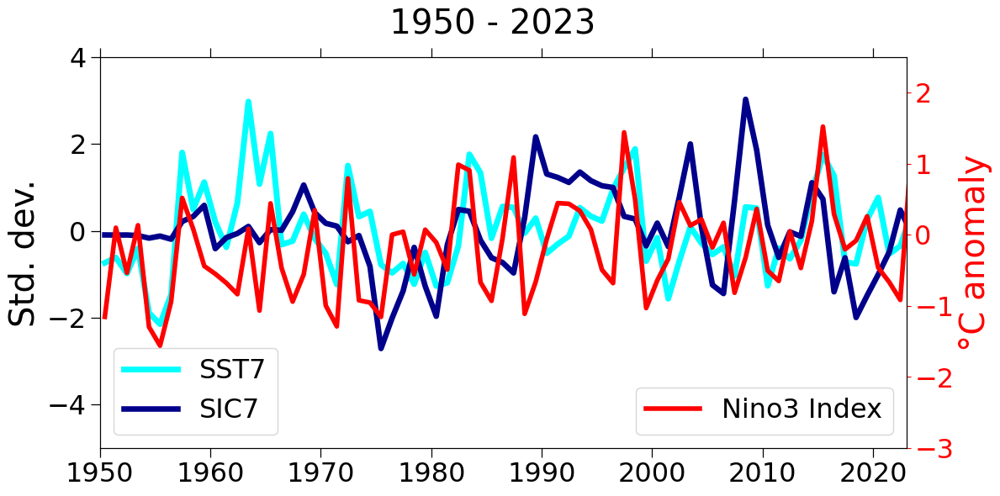

In [55]:
# Create the figure and axes objects
fig, ax1 = plt.subplots(figsize=(12, 6))
ENSO_data = pd.read_excel("Nino3_Index_1950_2023_NOAA.xlsx")

# Use geocat.viz.util convenience function to set axes tick values
gvutil.set_titles_and_labels(ax1,
                             lefttitle=f'                           1950 - 2023',
                             lefttitlefontsize=29,
                             righttitle=f'',
                             righttitlefontsize=29,
                             xlabel="",
                             ylabel="Std. dev.",
                             labelfontsize=29)
gv.add_major_minor_ticks(ax1,
                         x_minor_per_major=1,
                         y_minor_per_major=1,
                         labelsize=23)

# Plot SST and SIC data
ax1.plot(ds1.time, PC7sst, color='aqua', linewidth=5, label='SST7')
ax1.plot(ds1.time, PC7sic, color='darkblue', linewidth=4.75, label='SIC7')
ax1.set_ylim(-5, 4)  # Adjust the limits as needed
ax1.legend(prop={"size": 23},loc='lower left')

# Set x-axis limits and tick positions
ax1.set_xlim(pd.Timestamp('1950-01-01'), pd.Timestamp('2023-01-01'))
ax1.xaxis.set_major_locator(mdates.YearLocator(base=10))

# Create secondary y-axis for AMO data
ax2 = ax1.twinx()
ax2.plot(ds1.time, ENSO_data['Values'], color='red', linewidth=4, label='Nino3 Index')
ax2.set_ylabel('°C anomaly', fontsize=29, color='red')
ax2.tick_params(axis='y', colors='red', labelsize=23)  # Set label font size
ax2.set_ylim(-3, 2.5)  # Adjust the limits as needed
ax2.legend(prop={"size": 23}, loc='lower right')
# Adjust layout and display the plot

#plt.savefig("CCA.PC3.pdf",format="pdf", bbox_inches = 'tight', dpi= 600)
plt.savefig("Figure_S4d_ERA5_CCA5.Time_Series.jpg", bbox_inches = 'tight', dpi= 600)
plt.tight_layout()
plt.show()

***Save the three SIC spatial structures (used to compare CMIP output)***

In [56]:
import xarray as xr

# Create a new dataset using the existing DataArrays
regression_ds = xr.Dataset(
    {
        "sic1": regSIC1,
    }
)

# Save to a NetCDF file
regression_ds.to_netcdf("SIC_OBS_CCA1_CO2.nc")

In [57]:
import xarray as xr

# Create a new dataset using the existing DataArrays
regression_ds = xr.Dataset(
    {
        "sic2": regSIC2,
    }
)

# Save to a NetCDF file
regression_ds.to_netcdf("SIC_OBS_CCA2_AMO.nc")

In [58]:
# Create a new dataset using the existing DataArrays
regression_ds = xr.Dataset(
    {
        "sic3": regSST3,
    }
)
# Save to a NetCDF file
regression_ds.to_netcdf("SIC_OBS_CCA3_IPO.nc")